## **Ensemble Techniques - HUMAN RESOURCES ATTRITION CASE STUDY**

## **Analyze McCurr Health Consultancy Employee Data**

## **Date: August 20, 2022**

## **Mentor Session Content  MLS1**

- Decision Tree Classifier
- Random Forest Classifier

## **HR Attrition Case Study**



-----------------------------------------------------------------------------------------------------------------------
# **Employee Attrition Prediction**
-----------------------------------------------------------------------------------------------------------------------



--------------------
## **Context**
--------------------

McCurr Health Consultancy is an MNC that has thousands of employees spread across the globe. The company believes in hiring the best talent available and retaining them for as long as possible. A huge amount of resources is spent on retaining existing employees through various initiatives. The Head of People Operations wants to bring down the cost of retaining employees. For this, he proposes limiting the incentives to only those employees who are at risk of attrition. As a recently hired Data Scientist in the People Operations Department, you have been asked to identify patterns in characteristics of employees who leave the organization. Also, you have to use this information to **predict if an employee is at risk of attrition.** This information will be used to target them with incentives.

-----------------------
## **Objective** 
-----------------------

* To identify the different factors that drive attrition
* To build a model to predict if an employee will attrite or not

------------------------------------
## **Dataset Description**
------------------------------------

The data contains information on employees' demographic details, work-related metrics, and attrition flag.

* **EmployeeNumber** - Unique Employee Identifier
* **Attrition** - Did the employee attrite or not?
* **Age** - Age of the employee
* **BusinessTravel** - Travel commitments for the job
* **DailyRate** - Data description not available
* **Department** - Employee's Department
* **DistanceFromHome** - Distance from work to home (in KM)
* **Education** - Employee's Education. 1-Below College, 2-College, 3-Bachelor, 4-Master, 5-Doctor
* **EducationField** - Field of Education
* **EnvironmentSatisfaction** - 1-Low, 2-Medium, 3-High, 4-Very High
* **Gender** - Employee's gender
* **HourlyRate** - Data description not available
* **JobInvolvement** - 1-Low, 2-Medium, 3-High, 4-Very High
* **JobLevel** - Level of job (1 to 5)
* **JobRole** - Job Roles
* **JobSatisfaction** - 1-Low, 2-Medium, 3-High, 4-Very High
* **MaritalStatus** - Marital Status
* **MonthlyIncome** - Monthly Salary
* **MonthlyRate** - Data description not available
* **NumCompaniesWorked** - Number of companies worked at
* **Over18** - Whether the employee is over 18 years of age?
* **OverTime** - Whether the employee is doing overtime?
* **PercentSalaryHike** - The percentage increase in the salary last year
* **PerformanceRating** - 1-Low, 2-Good, 3-Excellent, 4-Outstanding
* **RelationshipSatisfaction** - 1-Low, 2-Medium, 3-High, 4-Very High
* **StandardHours** - Standard Hours
* **StockOptionLevel** - Stock Option Level
* **TotalWorkingYears** - Total years worked
* **TrainingTimesLastYear** - Number of training attended last year
* **WorkLifeBalance** - 1-Low, 2-Good, 3-Excellent, 4-Outstanding
* **YearsAtCompany** - Years at Company
* **YearsInCurrentRole** - Years in the current role
* **YearsSinceLastPromotion** - Years since the last promotion
* **YearsWithCurrManager** - Years with the current manager

**In the real world, you will not find definitions for some of your variables. It is the part of the analysis to figure out what they might mean**.

### **Note**

Kindly **do not run** the code cells containing Hyperparameter Tuning using **GridSearchCV during the session**, since **they take considerable time to run.**

## **Google Colab API**

In [141]:
# Mount drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Importing the libraries and overview of the dataset**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# To scale the data using z-score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Algorithms to use
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Metrics to evaluate the model
from sklearn import metrics
from sklearn.metrics import (
    confusion_matrix, 
    classification_report,
    recall_score,
    precision_score, 
    accuracy_score)

# For tuning the model
from sklearn.model_selection import (
    GridSearchCV,
    RandomizedSearchCV)

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

### **Note: The first section of the notebook is the section that has been covered multiple times in the previous case studies.  For this discussion this part can be skipped and we can directly refer to this <a href = #eda>summary</a> of data cleaning steps and observations from EDA.**

### **Loading the Dataset**

In [3]:
# Loading the dataset
data = pd.read_excel('/content/drive/MyDrive/mit_pe_adsp_great_learning/practical_data_science/MLS1_decision_trees/data/HR_Employee_Attrition_Dataset.xlsx')
df = data.copy()

In [4]:
# Looking at the first 5 records
df.head()

,EmployeeNumber,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,Yes,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,...,1,80,0,8,0,1,6,4,0,5
1,2,No,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,...,4,80,1,10,3,3,10,7,1,7
2,3,Yes,37,Travel_Rarely,1373,Research & Development,2,2,Other,4,...,2,80,0,7,3,3,0,0,0,0
3,4,No,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,...,3,80,0,8,3,3,8,7,3,0
4,5,No,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,...,4,80,1,6,3,3,2,2,2,2


In [5]:
df.tail()

,EmployeeNumber,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
2935,2936,No,36,Travel_Frequently,884,Research & Development,23,2,Medical,3,...,3,80,1,17,3,3,5,2,0,3
2936,2937,No,39,Travel_Rarely,613,Research & Development,6,1,Medical,4,...,1,80,1,9,5,3,7,7,1,7
2937,2938,No,27,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,...,2,80,1,6,0,3,6,2,0,3
2938,2939,No,49,Travel_Frequently,1023,Sales,2,3,Medical,4,...,4,80,0,17,3,2,9,6,0,8
2939,2940,No,34,Travel_Rarely,628,Research & Development,8,3,Medical,2,...,1,80,0,6,3,4,4,3,1,2


In [6]:
df.sample(5)

,EmployeeNumber,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1210,1211,No,33,Travel_Rarely,267,Research & Development,21,3,Medical,2,...,4,80,3,14,6,3,14,11,2,13
81,82,No,35,Travel_Rarely,1214,Research & Development,1,3,Medical,2,...,1,80,0,6,3,3,6,4,0,4
423,424,No,30,Non-Travel,1398,Sales,22,4,Other,3,...,3,80,0,10,3,3,9,8,7,8
599,600,No,36,Travel_Rarely,1041,Human Resources,13,3,Human Resources,3,...,2,80,1,8,2,3,5,2,0,4
1166,1167,No,48,Travel_Frequently,365,Research & Development,4,5,Medical,3,...,2,80,1,23,3,3,2,2,2,2


### **Understand the shape of the dataset.**

In [7]:
df.shape

(2940, 34)

## Observation
* The dataset has 2940 rows and 34 columns of data

### **Checking the info of the dataset**

In [8]:
# Let us see the info of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2940 entries, 0 to 2939
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   EmployeeNumber            2940 non-null   int64 
 1   Attrition                 2940 non-null   object
 2   Age                       2940 non-null   int64 
 3   BusinessTravel            2940 non-null   object
 4   DailyRate                 2940 non-null   int64 
 5   Department                2940 non-null   object
 6   DistanceFromHome          2940 non-null   int64 
 7   Education                 2940 non-null   int64 
 8   EducationField            2940 non-null   object
 9   EnvironmentSatisfaction   2940 non-null   int64 
 10  Gender                    2940 non-null   object
 11  HourlyRate                2940 non-null   int64 
 12  JobInvolvement            2940 non-null   int64 
 13  JobLevel                  2940 non-null   int64 
 14  JobRole                 

**Observations:**

- There are **2940 observations and 34 columns** in the dataset.
- All the columns have 2940 non-null values, i.e., **there are no missing values in the data.**

**Let's check the unique values in each column** 

In [9]:
# Checking the count of unique values in each column
df.nunique()

EmployeeNumber              2940
Attrition                      2
Age                           43
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBalance                4
YearsAtCom

**Observations:**

- **Employee number is an identifier** which is unique for each employee and **we can drop this column** as it would not add any value to our analysis.
- **Over18 and StandardHours have only 1 unique value.** These columns will not add any value to our model hence we can drop them.
- Over18 and StandardHours have only 1 unique value. We can drop these columns as they will not add any value to our analysis.
- On the basis of number of unique values in each column and the data description, we can identify the continuous and categorical columns in the data.

**Let's drop the columns mentioned above** and define lists for numerical and categorical columns to explore them separately.

In [10]:
# Dropping the columns
df = df.drop(['EmployeeNumber', 'Over18', 'StandardHours'] , axis = 1)

In [11]:
# Creating numerical columns
num_cols = ['DailyRate', 'Age', 'DistanceFromHome', 'MonthlyIncome', 'MonthlyRate', 'PercentSalaryHike', 'TotalWorkingYears', 
            'YearsAtCompany', 'NumCompaniesWorked', 'HourlyRate', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 
            'YearsWithCurrManager', 'TrainingTimesLastYear']

# Creating categorical variables
cat_cols = ['Attrition', 'OverTime', 'BusinessTravel', 'Department', 'Education', 'EducationField', 'JobSatisfaction', 'EnvironmentSatisfaction', 
            'WorkLifeBalance', 'StockOptionLevel', 'Gender', 'PerformanceRating', 'JobInvolvement', 'JobLevel', 'JobRole', 'MaritalStatus', 'RelationshipSatisfaction']

## **Exploratory Data Analysis and Data Preprocessing**

### **Note:** 
We have explored this data earlier in the case study from the machine learning course week. Here, we will simply look at some basic univariate analysis and data preprocessing and move to the model building section.

### **Univariate analysis of numerical columns**

In [12]:
# Checking summary statistics
df[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
DailyRate,2940.0,802.485714,403.440447,102.0,465.0,802.0,1157.0,1499.0
Age,2940.0,36.923810,9.133819,18.0,30.0,36.0,43.0,60.0
DistanceFromHome,2940.0,9.192517,8.105485,1.0,2.0,7.0,14.0,29.0
MonthlyIncome,2940.0,6502.931293,4707.155770,1009.0,2911.0,4919.0,8380.0,19999.0
MonthlyRate,2940.0,14313.103401,7116.575021,2094.0,8045.0,14235.5,20462.0,26999.0
PercentSalaryHike,2940.0,15.209524,3.659315,11.0,12.0,14.0,18.0,25.0
TotalWorkingYears,2940.0,11.279592,7.779458,0.0,6.0,10.0,15.0,40.0
YearsAtCompany,2940.0,7.008163,6.125483,0.0,3.0,5.0,9.0,40.0
NumCompaniesWorked,2940.0,2.693197,2.497584,0.0,1.0,2.0,4.0,9.0
HourlyRate,2940.0,65.891156,20.325969,30.0,48.0,66.0,84.0,100.0


**Observations:**

- **Average employee age is around 37 years**. It has a high range, from 18 years to 60, indicating good age diversity in the organization.
- **At least 50% of the employees live within a 7 KM radius** of the organization. However, there are some extreme values, given that the maximum value is 29 km.
- **The average monthly income of an employee is USD 6500.** It has a high range of values from 1K-20K USD, which is to be expected for any organization's income distribution. There is a big difference between the 3rd quartile value (around USD 8400) and the maximum value (nearly USD 20000), showing that the **company's highest earners have a disproportionately large income** in comparison to the rest of the employees. Again, this is fairly common in most organizations.
- **The average salary hike of an employee is around 15%.** At least 50% of employees got a salary hike of 14% or less, with the maximum salary hike being 25%.
- The average number of years an employee is associated with the company is 7. 
- **On average, the number of years since an employee got a promotion is ~2.19**. The majority of employees have been promoted since the last year.
- Scaling of the data
  -  Decision trees and ensemble methods do not require feature scaling to be performed as they are not sensitive to the variance in the data.
  - We don't plan to use the Logistic Regression model.  If so, we would need to deal with the outliers, missing values, and scaling of the data.

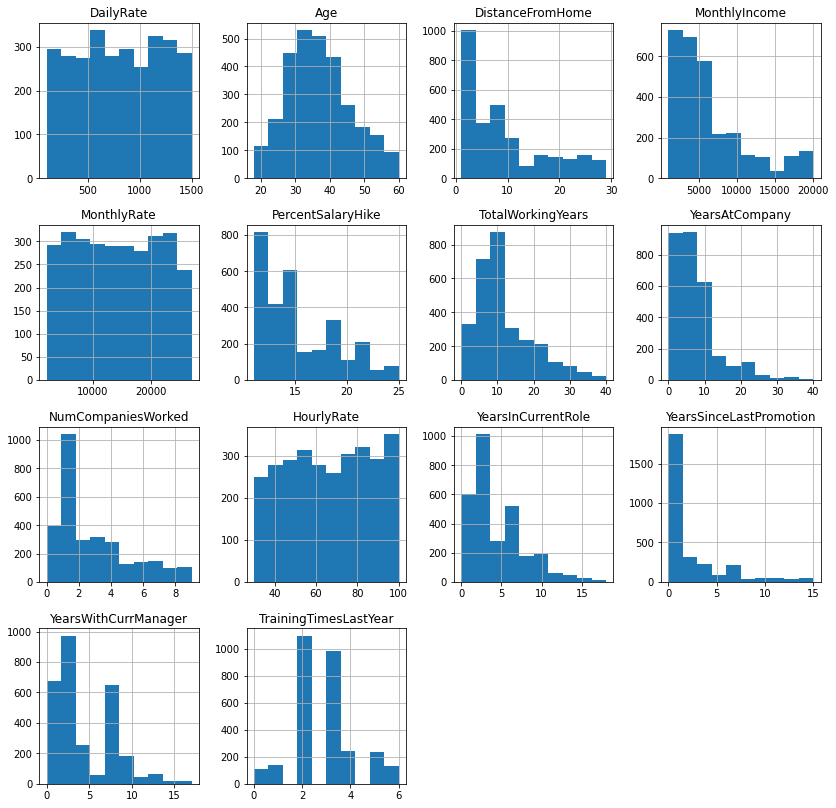

In [13]:
# Creating histograms
df[num_cols].hist(figsize = (14, 14))

plt.show()

**Observations:**

- **The age distribution is close to a normal distribution**, with the majority of employees between the ages of 25 and 50.
- **DistanceFromHome also has a right-skewed distribution**, meaning most employees live close to work but there are a few that live further away.
- **MonthlyIncome and TotalWorkingYears are skewed to the right**, indicating that the majority of workers are in entry / mid-level positions in the organization.
- **The percentage salary hike is skewed to the right**, which means employees are mostly getting lower percentage salary increaseS.
- **The YearsAtCompany variable distribution shows a good proportion of workers with 10+ years**, indicating a significant number of loyal employees at the organization. 
- **The YearsInCurrentRole distribution has three peaks at 0, 2, and 7.** There are a few employees that have even stayed in the same role for 15 years and more.
- **The YearsSinceLastPromotion variable distribution indicates that some employees have not received a promotion in 10-15 years and are still working in the organization.** These employees are assumed to be high work-experience employees in upper-management roles, such as co-founders, C-suite employees, etc.
- The distributions of DailyRate, HourlyRate, and MonthlyRate appear to be uniform and do not provide much information. It could be that the daily rate refers to the income earned per extra day worked while the hourly rate could refer to the same concept applied for extra hours worked per day. Since these rates tend to be broadly similar for multiple employees in the same department, that explains the uniform distribution they show.

## **Quick Look at the Categorical Variables**

In [14]:
dummy_df = data.copy()
for i in set(cat_cols):
    dummy_df[i] = dummy_df[i].astype('category')

In [15]:
dummy_df.describe(include=['category']).T

,count,unique,top,freq
Attrition,2940,2,No,2466
BusinessTravel,2940,3,Travel_Rarely,2086
Department,2940,3,Research & Development,1922
Education,2940,5,3,1144
EducationField,2940,6,Life Sciences,1212
EnvironmentSatisfaction,2940,4,3,906
Gender,2940,2,Male,1764
JobInvolvement,2940,4,3,1736
JobLevel,2940,5,1,1086
JobRole,2940,9,Sales Executive,652


## **Observation**
* Attrition is our target variable with 84% records 'No' or employee will not attrite.
* Majority of the employees have low business travel requirements
* Majority of the employees are from the Research and Development department.
* There are more male employees than female employees.

### **Univariate analysis for categorical variables**

In [16]:
# Printing the % sub categories of each category.
for i in cat_cols:
    
    print(df[i].value_counts(normalize = True))
    print('*' * 40)
    print()

No     0.838776
Yes    0.161224
Name: Attrition, dtype: float64
****************************************

No     0.717007
Yes    0.282993
Name: OverTime, dtype: float64
****************************************

Travel_Rarely        0.709524
Travel_Frequently    0.188435
Non-Travel           0.102041
Name: BusinessTravel, dtype: float64
****************************************

Research & Development    0.653741
Sales                     0.303401
Human Resources           0.042857
Name: Department, dtype: float64
****************************************

3    0.389116
4    0.270748
2    0.191837
1    0.115646
5    0.032653
Name: Education, dtype: float64
****************************************

Life Sciences       0.412245
Medical             0.315646
Marketing           0.108163
Technical Degree    0.089796
Other               0.055782
Human Resources     0.018367
Name: EducationField, dtype: float64
****************************************

4    0.312245
3    0.300680
1    0.196599
2

### **Observations:**

- **The employee attrition rate is ~16%.**
- **Around 28% of the employees are working overtime.** This number appears to be on the higher side and might indicate a stressed employee work-life.
- 71% of the employees have traveled rarely, while around 19% have to travel frequently.
- Around 73% of the employees come from an educational background in the Life Sciences and Medical fields. 
- Over 65% of employees work in the Research & Development department of the organization.
- **Nearly 40% of the employees have low (1) or medium-low (2) job satisfaction** and environment satisfaction in the organization, indicating that the morale of the company appears to be somewhat low.
- **Over 30% of the employees show low (1) to medium-low (2) job involvement.** 
- Over 80% of the employees either have none or very few stock options. 
- **In terms of performance ratings, none of the employees have rated lower than 3 (excellent).** About 85% of employees have a performance rating equal to 3 (excellent), while the remaining have a rating of 4 (outstanding). This could either mean that the majority of employees are top performers, or the more likely scenario is that the organization could be highly lenient with its performance appraisal process.

### <a name='eda'>Summary of EDA</a>

**Data Description:**
- There are **2940 observations and 34 columns** in the dataset.
- All the columns have 2940 non-null values, i.e., **there are no missing values in the data.**

**Observations from EDA:**

- **`EmployeeNumber` is an identifier** which is unique for each employee and **we can drop this column** as it would not add any value to our analysis.
- **`Over18` and `StandardHours` have only 1 unique value.** These columns will not add any value to our model hence we can drop them.
- **On average, the number of years since an employee got a promotion is ~2.19**. The majority of employees have been promoted since the last year.
- **The average monthly income of an employee is USD 6500.** It has a high range of values from 1K-20K USD, which is to be expected for any organization's income distribution. There is a big difference between the 3rd quartile value (around USD 8400) and the maximum value (nearly USD 20000), showing that the **company's highest earners have a disproportionately large income** in comparison to the rest of the employees. Again, this is fairly common in most organizations.
- **The `age` distribution is close to a normal distribution**, with the majority of employees between the ages of 25 and 50.
- **`DistanceFromHome` also has a right-skewed distribution**, meaning most employees live close to work but there are a few that live further away.
- **`MonthlyIncome` and `TotalWorkingYears` are skewed to the right**, indicating that the majority of workers are in entry / mid-level positions in the organization.
- **The percentage salary hike is skewed to the right**, which means employees are mostly getting lower percentage salary increaseS.
- **The `YearsAtCompany` variable distribution shows a good proportion of workers with 10+ years**, indicating a significant number of loyal employees at the organization.
- **The employee attrition rate is ~16%.**
- **Around 28% of the employees are working overtime.** This number appears to be on the higher side and might indicate a stressed employee work-life
- **Nearly 40% of the employees have low (1) or medium-low (2) job satisfaction** and environment satisfaction in the organization, indicating that the morale of the company appears to be somewhat low.

### Note: The EDA section has been covered multiple times in the previous case studies. In this case study we will mainly focus on the model building aspect. So here we will look at the key observations from the EDA only. If you want to check out the detailed EDA, you can refer [here](#appendix). 

**Now that we have explored our data, let's build the model.**

<a name='data_preparation'></a>
## **Model Building - Approach**

1. Data preparation.
2. Partition the data into a train and test set.
3. Build a model on the train data.
4. Tune the model if required.
5. Test the data on the test set.

## **Data preparation**

## **IMBALANCED DATASETS WRT RESPONSE VARIABLE**
- Look at the variation or values for the Attrition variable

In [17]:
df['Attrition'].value_counts()

No     2466
Yes     474
Name: Attrition, dtype: int64

In [18]:
df['Attrition'].value_counts(1)

No     0.838776
Yes    0.161224
Name: Attrition, dtype: float64

## **Observation**
- Remember the imbalance values for No/Yes.
  - this will be used for the class_weights value in the Decision Tree and Random Forest Classifier hyperparameter value.

## **Observation**
- The dataset is imbalanced
  - Yes - 474  or 16.12%
  - No - 2466  or 83.88%

**Creating dummy variables for the categorical variables**
- convert all of the categorical variables to one hot encoding via pd.get_dummies

## `Attrition` Feature 
  - if data["`Attrition`"] ==`Yes`==> Y =1
  - elif data["`Attrition`"] ==`No` ==> Y =0


## OverTime Feature
  - if data["`OverTime`"] ==`Yes` =1
  - elif data["`OverTime`"] ==`No` =0


In [19]:
# Creating a list of columns for which we will create dummy variables
to_get_dummies_for = ['BusinessTravel', 'Department', 'EducationField', 'Gender', 'MaritalStatus', 'JobRole']

# Creating dummy variables
df = pd.get_dummies(data = df, columns = to_get_dummies_for, drop_first = True)      

# Mapping overtime and attrition
dict_OverTime = {'Yes': 1, 'No': 0}
dict_attrition = {'Yes': 1, 'No': 0}

df['OverTime'] = df.OverTime.map(dict_OverTime)
df['Attrition'] = df.Attrition.map(dict_attrition)

## **Identify Independent Variables**
- drop `Attribute` from the list of the X independent variables

## **Identify Dependent (Response/Target) Variable**
- set the response **Y** variable to `Attribute`



## **Separating the independent variables (X) and the dependent variable (Y)**

In [20]:
# Separating the target variable and other variables
Y = df.Attrition                           ## TARGET OR RESPONSE VARIABLE

X = df.drop(['Attrition'], axis = 1)       ## INDEPENDENT VARIABLES

## **Split Data**
* When classification problems exhibit a significant imbalance in the distribution of the target classes, it is good to use stratified sampling to ensure that relative class frequencies are approximately preserved in train and test sets. 
* This is done using the `stratify` parameter in the train_test_split function.

**Splitting the data into 70% train and 30% test set**

In [21]:
# Splitting the data
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3, random_state = 1, stratify = Y)

## **IMBALANCED DATASETS WRT RESPONSE VARIABLE**

In [22]:
Y.value_counts(1)

0    0.838776
1    0.161224
Name: Attrition, dtype: float64

In [23]:
y_test.value_counts(1)

0    0.839002
1    0.160998
Name: Attrition, dtype: float64

## SHAPE OF X & Y

In [24]:
x_train.shape

(2058, 44)

In [25]:
x_test.shape

(882, 44)

In [26]:
y_test.shape

(882,)

In [27]:
y_train.shape

(2058,)

## **Model evaluation criterion**

**The model can make two types of wrong predictions:**

1. Predicting an employee will attrite when the employee doesn't attrite
2. Predicting an employee will not attrite when the employee actually attrites

**Which case is more important?**

* **Predicting that the employee will not attrite but the employee attrites**, i.e., losing out on a valuable employee or asset. This would be considered a major miss for any employee attrition predictor and is hence the more important case of wrong predictions.

**How to reduce this loss i.e the need to reduce False Negatives?**
* **The company would want the Recall to be maximized**, the greater the Recall, the higher the chances of minimizing false negatives. Hence, the focus should be on increasing the Recall (minimizing the false negatives) or, in other words, identifying the true positives (i.e. Class 1) very well, so that the company can provide incentives to control the attrition rate especially, for top-performers. This would help in optimizing the overall project cost towards retaining the best talent.

- reference
  - https://en.wikipedia.org/wiki/Precision_and_recall

**Also, let's create a function to calculate and print the classification report and confusion matrix so that we don't have to rewrite the same code repeatedly for each model.**

In [28]:
# Creating metric function

def metrics_score(actual, predicted):
    
    print(classification_report(actual, predicted))
    cm = confusion_matrix(actual, predicted)
    plt.figure(figsize = (8, 5))
    sns.heatmap(cm, annot = True, fmt = '.2f', xticklabels = ['Not Attrite', 'Attrite'], yticklabels = ['Not Attrite', 'Attrite'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

In [29]:
def model_performance_classification(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance
    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # Predicting using the independent variables
    pred = model.predict(predictors)
    recall = recall_score(target, pred,average = 'macro')                 # To compute recall
    precision = precision_score(target, pred, average = 'macro')              # To compute precision
    acc = accuracy_score(target, pred)                                 # To compute accuracy score
    
    # Creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Precision":  precision,
            "Recall":  recall,
            "Accuracy": acc,
        },
        
        index = [0],
    )

    return df_perf

In [30]:
pip install mglearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


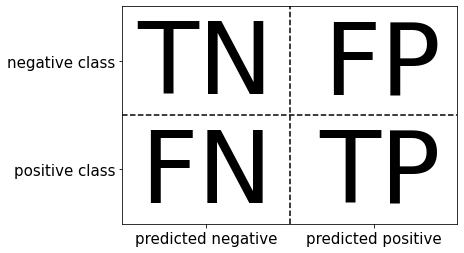

In [31]:
import mglearn
mglearn.plots.plot_binary_confusion_matrix()

## Relation to accuracy

## Accuracy = (TP + TN)/(TP + TN + FP + FN)
Accuracy is the number of correct predictions (TP
and TN) divided by the number of samples (all entries of the confusion matrix summed up).

## Precision = TP/(TP + FP)
Precision measures how many of the samples predicted as positive are actually positive.

Precision is used as a performance metric when the goal is to limit the number of false positives. As an example, imagin a model for predicting whether a new drug will be effective in treating a disease in clinical trials. Clinical trials are notoriously expensive, and a pharamaceutical company will only want to run an experiement if it is very sure that the drug will actually work. Therefore, it is important that the model does not produce many false positives -- in other words, that is has a high precision. Precision is also known as positive predictive value (PPV).

## Recall = TP/(TP + FN)
Recall measures how many of the positive samples are captured by the positive predictions.

Recall is used a performance metric when we need to identify all positive samples when it is important to avoid false negatives. The cancer diagnosis example for this:

It is important to find all people who are sick, possibly including healthy patients in the prediction. Other names for recall are sensitivity, hit rate, or true positive rate (TPR).

There is a trade-off between optimizing recall and optimizing precision. You can trivially obtain s perfect recall if you predict all samples to belong to the positive class -- there will be no false negatives, and no true negatives either. However, prediciting all samples as positive will result in many false positives, and therefore the precision will be very low. On the other hand, if you find a model that predicts only the single data point it is most sure about as positive and the rest as negative, then precision will be perfect (assuming this data point is in fact positive), but recall will be very bad.

- FP is also known as Type 1 Error
- FN is also known as Type II Error


Note:
-  Reference, Introduction to Machine Learning with Python, A Guide for Data Scientists, Authors: Andreas C. Muller and Sarah Guido, ISBN: 978-1-449-36941-5

## **Building the model**

We will be building 2 different models:

- **Decision Tree**
- **Random Forest**


### **Building a Decision Tree Model**

* We will build our model using the **DecisionTreeClassifier function.** 
* If the frequency of class A is 17% and the frequency of class B is 83%, then class B will become the dominant class and **the decision tree will become biased toward the dominant class.**
* **class_weight is a hyperparameter** for the decision tree classifier, and in this case, we can pass a dictionary {0:0.17, 1:0.83} to the model to specify the weight of each class and the decision tree will give more weightage to class 1.

## **Decision Trees**


Note: Decision and Classification Trees, Clearly Explained
   - reference: 
      - https://www.youtube.com/watch?v=_L39rN6gz7Y&t=930s (Decision and Classification Trees, Clearly Explained!!!)
      - https://www.youtube.com/watch?v=wpNl-JwwplA (StatQuest: Decision Trees, Part 2 - Feature Selection and Missing Data)
      - https://youtu.be/_L39rN6gz7Y (StatQuest: Josh Stammer, Decision Tree Classification)
      - https://online.stat.psu.edu/stat857/node/236/ (Decision Tree)

In [32]:
# Building decision tree model
dt = DecisionTreeClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1)

In [33]:
# Fitting decision tree model
dt.fit(x_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)

**Let's check the model performance of decision tree**

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1726
           1       1.00      1.00      1.00       332

    accuracy                           1.00      2058
   macro avg       1.00      1.00      1.00      2058
weighted avg       1.00      1.00      1.00      2058



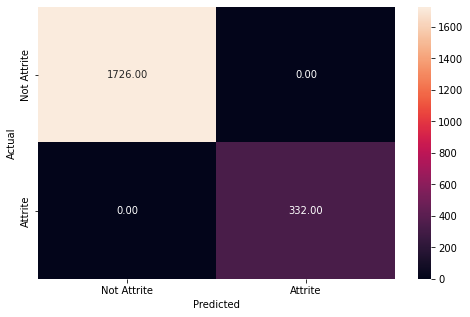

In [34]:
# Checking performance on the training dataset
y_train_pred_dt = dt.predict(x_train)

metrics_score(y_train, y_train_pred_dt)

**Observation:**

- The Decision tree is giving a **100% score for all metrics on the training dataset.**

              precision    recall  f1-score   support

           0       0.97      0.95      0.96       740
           1       0.77      0.85      0.81       142

    accuracy                           0.93       882
   macro avg       0.87      0.90      0.88       882
weighted avg       0.94      0.93      0.94       882



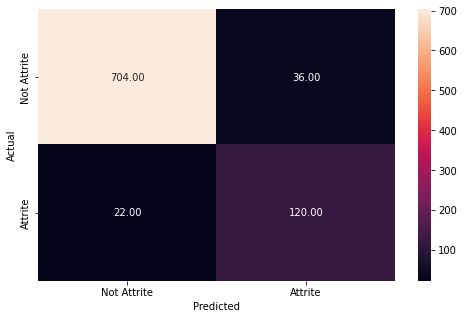

In [35]:
# Checking performance on the test dataset
y_test_pred_dt = dt.predict(x_test)

metrics_score(y_test, y_test_pred_dt)

In [36]:
dtree_test = model_performance_classification(dt,x_test,y_test)
dtree_test

,Precision,Recall,Accuracy
0,0.869464,0.898211,0.93424


**Observations:**

- The Decision Tree works well on the training data but **not so well on the test data** as the recall is 0.83 in comparison to 1 for the training dataset, i.e., the Decision Tree is overfitting the training data.
- The precision on the test data suggests that there's a 25% (1 - 0.75) chance that the model will predict that a person is going to leave even though he/she would not, and **the company may waste their time and energy on these employees who are not at risk of attrition.**

**Let's plot the feature importance and check the most important features.**

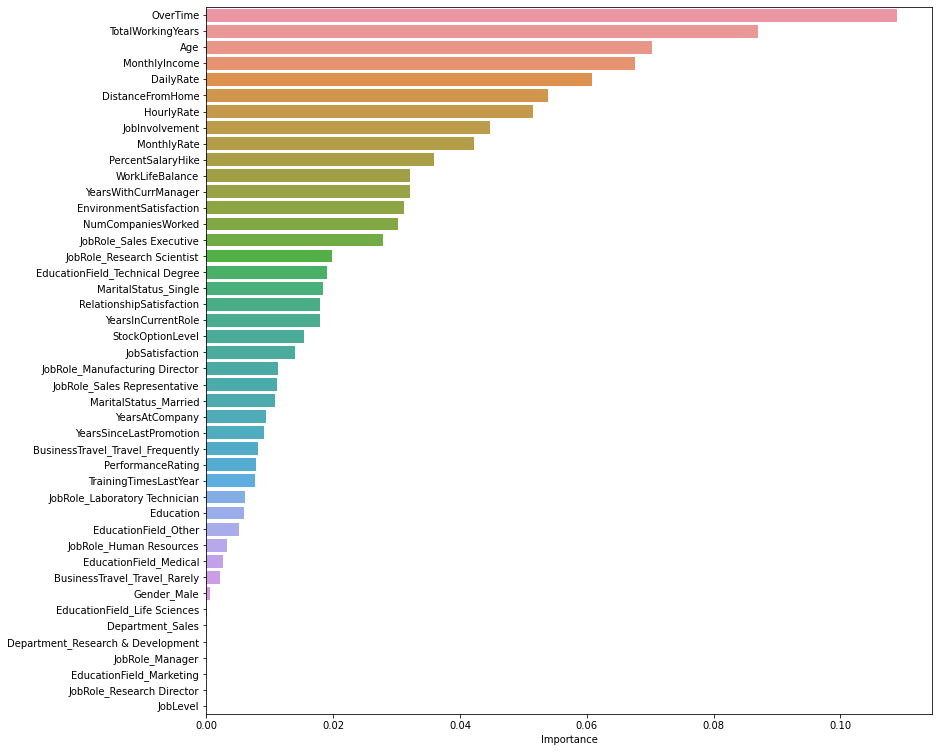

In [37]:
# Plot the feature importance
importances = dt.feature_importances_
columns = X.columns
importance_df = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)

plt.figure(figsize = (13, 13))
sns.barplot(importance_df.Importance,importance_df.index)

**Observations:**

- According to the Decision Tree, **Overtime is the most important feature, followed by Age, total working years, and Monthly income.** 
- This might signify that people who are at risk of attrition have low income, are doing overtime and have less experience. 
- The other important features are `DailyRate`, `DistanceFromHome`, `JobInvolvement`, and `PercentSalaryHike`.

**Let's try to tune the model and check if we could improve the results.**

## **Tuning Models**

## **What is hyperparameter tuning?**
- Hyperparameters are the parameters that govern the entire training process
- Their values are set before the learning process begins
- They have a significant effect on the model’s performance
- The process of finding optimal hyperparameters for a model is known as hyperparameter tuning
- Choosing optimal hyperparameters can lead to improvements in the overall model’s performance and
can help in reducing both overfitting and underfitting


## **Different types of hyperparameter tuning**
- Some models consist of a huge number of hyperparameters, and finding the optimal set of hyperparameters can be a very time-consuming process
-  To make the process efficient, we’ll look at 2 of the most common methods available in sklearn:
   - GridSearchCV
   - RandomizedSearchCV
- Grid search is best used when we have small search space, while Random search is best used when we have large search space
- We can use grid search to get the best possible results when we don’t have any time constraints, but when we have time constraints, it’s better to go with the random search
- Randomized search is known to give better results as compared to grid search
- GridSearchCV **tries out all different parameter values, while** RandomizedSearchCV **does not**

### **Tune the Model Using GridSearchCV**

### **Using GridSearch for Hyperparameter Tuning**

* Hyperparameter tuning is tricky in the sense that **there is no direct way to calculate how a change in the hyperparameter value will reduce the loss of your model**, so we usually resort to experimentation. We'll use Grid search to perform hyperparameter tuning.
* **Grid search is a tuning technique that attempts to compute the optimum values of hyperparameters.** 
* **It is an exhaustive search** that is performed on the specific parameter values of a model.
* The parameters of the estimator/model used to apply these methods are **optimized by cross-validated grid-search** over a parameter grid.

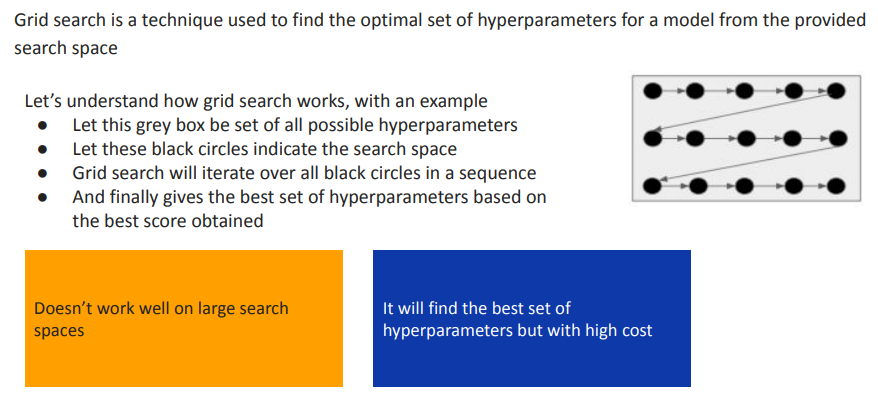

In [38]:
from IPython.display import Image

Image("/content/drive/MyDrive/mit_pe_adsp_great_learning/practical_data_science/MLS1_decision_trees/data/grid_search_cv.png")

## **Optional Material**

### **Tune the Model Using RandomizedSearchCV**

## **RandomizedSearchCV**

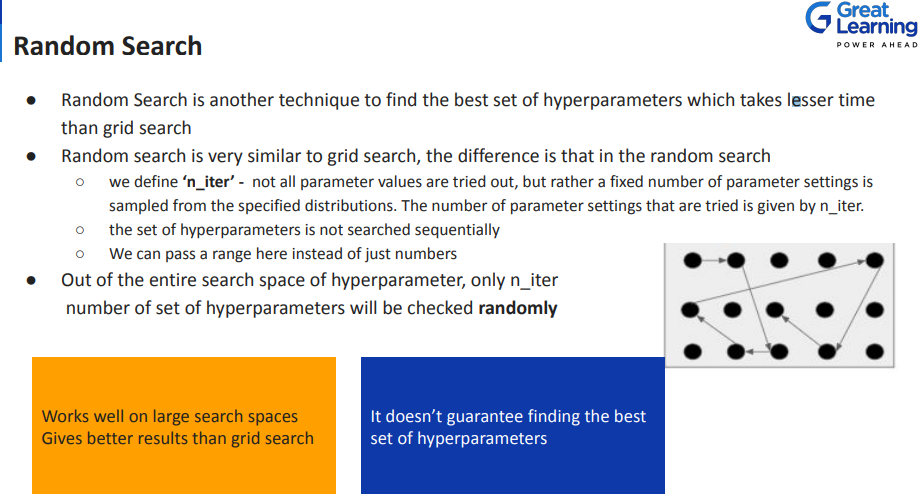

In [39]:
from IPython.display import Image

Image("/content/drive/MyDrive/mit_pe_adsp_great_learning/practical_data_science/MLS1_decision_trees/data/randomized_search_cv.png")

## **Back to GridSearchCV**

## **Tuning Hyperparameters via GridSearchCV**


**Criterion{“gini”,  “entropy”}**

The function is to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain.

**max_depth** 

The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.

**min_samples_leaf**

The minimum number of samples is required to be at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches. This may have the effect of smoothing the model, especially in regression.

In [40]:
# Choose the type of classifier
dtree_estimator = DecisionTreeClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1)

# Grid of parameters to choose from
parameters = {'max_depth': np.arange(2, 7), 
              'criterion': ['gini', 'entropy'],
              'min_samples_leaf': [5, 10, 20, 25]
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(recall_score, pos_label = 1)

# Run the grid search
gridCV = GridSearchCV(dtree_estimator, parameters, scoring = scorer, cv = 10)

# Fitting the grid search on the train data
gridCV = gridCV.fit(x_train, y_train)

# Set the classifier to the best combination of parameters
dtree_estimator = gridCV.best_estimator_

# Fit the best estimator to the data
dtree_estimator.fit(x_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, max_depth=2,
                       min_samples_leaf=5, random_state=1)

              precision    recall  f1-score   support

           0       0.92      0.72      0.81      1726
           1       0.32      0.68      0.43       332

    accuracy                           0.71      2058
   macro avg       0.62      0.70      0.62      2058
weighted avg       0.82      0.71      0.75      2058



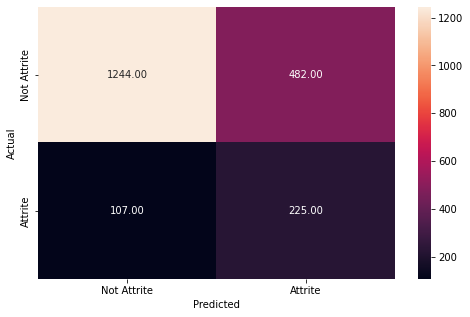

In [41]:
# Checking performance on the training dataset
y_train_pred_dt = dtree_estimator.predict(x_train)

metrics_score(y_train, y_train_pred_dt)

**Observation:**

- In comparison to the model with default values of hyperparameters, **the performance on the training set has gone down significantly.** This makes sense because we are trying to reduce overfitting.

              precision    recall  f1-score   support

           0       0.91      0.71      0.80       740
           1       0.29      0.61      0.39       142

    accuracy                           0.70       882
   macro avg       0.60      0.66      0.59       882
weighted avg       0.81      0.70      0.73       882



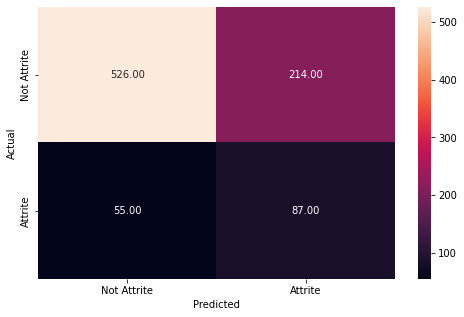

In [42]:
# Checking performance on the test dataset
y_test_pred_dt = dtree_estimator.predict(x_test)

metrics_score(y_test, y_test_pred_dt)

In [43]:
dtree_tuned_test = model_performance_classification(dtree_estimator,x_test,y_test)
dtree_tuned_test

,Precision,Recall,Accuracy
0,0.597186,0.661743,0.695011


**Observations:**

- The tuned model is not performing well in comparison to the model with default values of hyperparameters.
- This model is not overfitting the training data and giving approximately the same result on the test and train datasets.
- Precision has gone down significantly from .75 to .29 in comparison to the previous model which means the tuned model will give a high number of false positives, i.e., this model will predict the employee is going to leave even if they won't, and this will cost time and effort to the company.

**Let's look at the feature importance of this model and try to analyze why this is happening.**

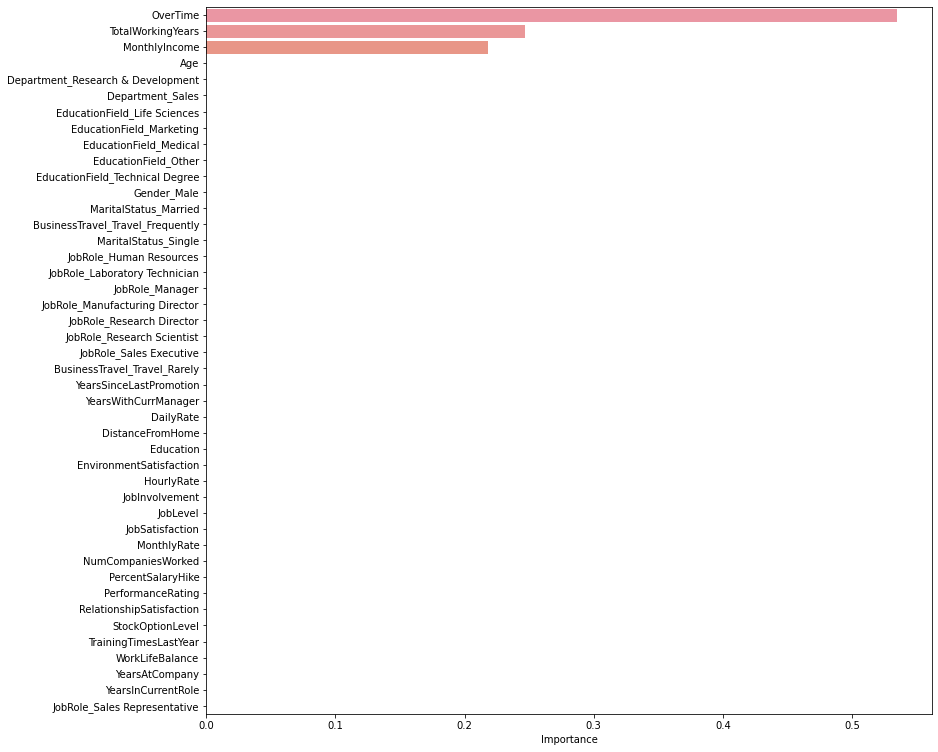

In [44]:
importances = dtree_estimator.feature_importances_
columns = X.columns

importance_df = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)
plt.figure(figsize = (13, 13))
sns.barplot(importance_df.Importance, importance_df.index)

**Observations:**

- After tuning the model we are getting that only 3 features are important. It seems like **the model is having high bias**, as it has over-simplified the problem and is not capturing the patterns associated with other variables.
- According to this model too, `OverTime`, `TotalWorkingYears`, and `MonthlyIncome` are the 3 most important features that describe why an employee is leaving the organization, which might imply that employees doing overtime may feel that their remuneration is not enough for their efforts.

**Let's plot the tree** and check if the assumptions about overtime income.

As we know the decision tree keeps growing until the nodes are homogeneous, i.e., it has only one class, and the dataset here has a lot of features, it would be hard to visualize the whole tree with so many features. Therefore, we are only visualizing the tree up to **max_depth = 4**.

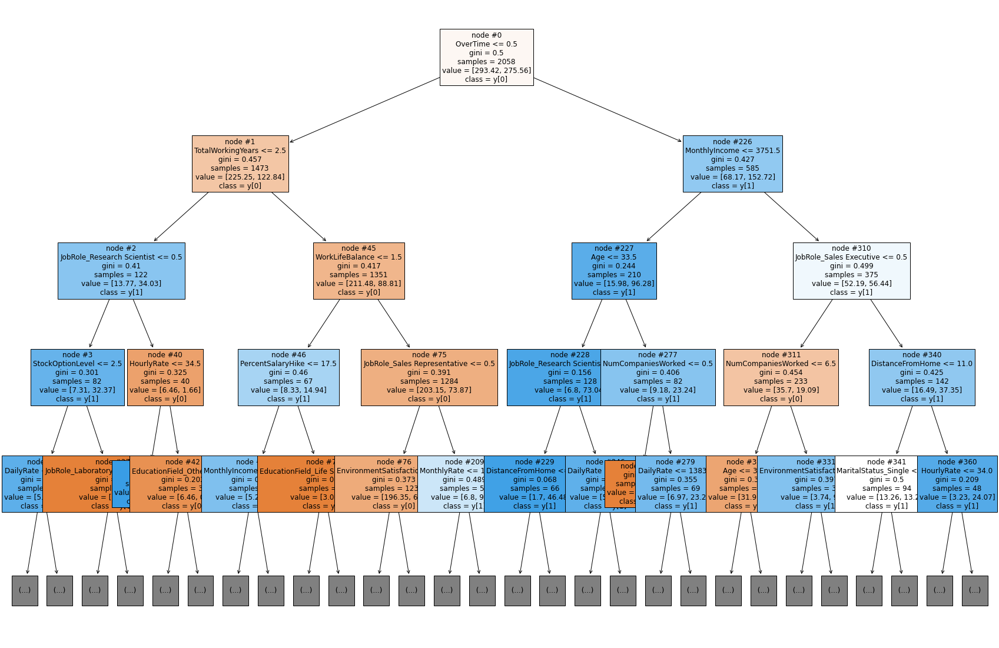

In [45]:
features = list(X.columns)

plt.figure(figsize = (30, 20))

tree.plot_tree(dt, max_depth = 4, feature_names = features, filled = True, fontsize = 12, node_ids = True, class_names = True)

plt.show()

### **Note:**

Blue leaves represent the attrition, i.e., **y[1]** and the orange leaves represent the non-attrition, i.e., **y[0]**. Also, the more the number of observations in a leaf, the darker its color gets.

**Observations:**

- Employees who are doing overtime with low salaries and low age have a chance of leaving the company, as they might feel overworked and underpaid and might be looking for better opportunities.
- Employees who are doing overtime with low salaries and are not research scientists have a high chance of attriting. 
- Employees, even if they have an income over 3751.5 units but working as sales executives and living far from home have a high chance of attriting.
- Another segment of people are who are doing overtime, with ages younger than 33.5 and not working as research scientists, have a greater chance of attrition. This implies that the model suggests except for the research scientist role, everyone who is young has a high tendency to attrite.
- Employees who have over 2.5 years of work experience but low work-life balance and low percentage hike also tend to attrite, probably as they are seeking a more balanced life.
- Employees who are not doing overtime, have low experience and are working as research scientists have a smaller chance of attriting. These employees are comfortable or loyal to the organization.
- `Numcompaniesworked` also seems to be an important variable in predicting if an employee's likely to attrite.

## **Optional Material**

## **ACTUAL WORK**

### **Tune the Model Using RandomizedSearchCV**

In [46]:
# Choose the type of classifier
dtree_estimator = DecisionTreeClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1)

# Grid of parameters to choose from
parameters = {'max_depth': np.arange(2, 7), 
              'criterion': ['gini', 'entropy'],
              'min_samples_leaf': [5, 10, 20, 25]
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(recall_score, pos_label = 1)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=dtree_estimator, 
                                   param_distributions=parameters, 
                                   n_iter=50, 
                                   n_jobs = -1, 
                                   scoring=scorer, 
                                   cv=10, 
                                   random_state=1)

# Fitting the RandomizedSearchCV search on the train data
randomized_cv  = randomized_cv.fit(x_train, y_train)

# Set the classifier to the best combination of parameters
dtree_estimator_rcv = randomized_cv.best_estimator_

# Fit the best estimator to the data
dtree_estimator_rcv.fit(x_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, max_depth=2,
                       min_samples_leaf=5, random_state=1)

              precision    recall  f1-score   support

           0       0.92      0.72      0.81      1726
           1       0.32      0.68      0.43       332

    accuracy                           0.71      2058
   macro avg       0.62      0.70      0.62      2058
weighted avg       0.82      0.71      0.75      2058



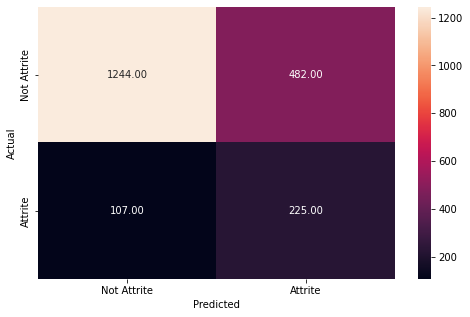

In [47]:
# Checking performance on the training dataset
y_train_pred_dt_rcv = dtree_estimator_rcv.predict(x_train)

metrics_score(y_train, y_train_pred_dt_rcv)

**Observation:**

- In comparison to the model with default values of hyperparameters, **the performance on the training set has gone down significantly.** This makes sense because we are trying to reduce overfitting.

              precision    recall  f1-score   support

           0       0.91      0.71      0.80       740
           1       0.29      0.61      0.39       142

    accuracy                           0.70       882
   macro avg       0.60      0.66      0.59       882
weighted avg       0.81      0.70      0.73       882



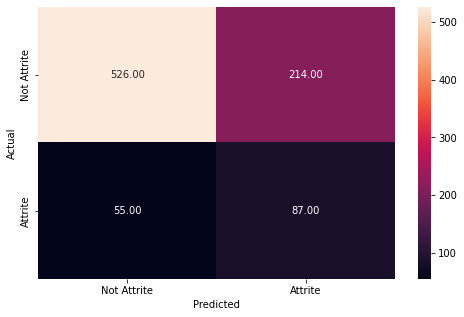

In [48]:
# Checking performance on the test dataset
y_test_pred_dt_rcv = dtree_estimator_rcv.predict(x_test)

metrics_score(y_test, y_test_pred_dt_rcv)

In [49]:
dtree_tuned_test_rcv = model_performance_classification(dtree_estimator_rcv,
                                                    x_test,
                                                    y_test)
dtree_tuned_test_rcv

,Precision,Recall,Accuracy
0,0.597186,0.661743,0.695011


**Observations:**

- The tuned model is not performing well in comparison to the model with default values of hyperparameters.
- This model is not overfitting the training data and giving approximately the same result on the test and train datasets.
- Precision has gone down significantly from .75 to .29 in comparison to the previous model which means the tuned model will give a high number of false positives, i.e., this model will predict the employee is going to leave even if they won't, and this will cost time and effort to the company.

**Let's look at the feature importance of this model and try to analyze why this is happening.**

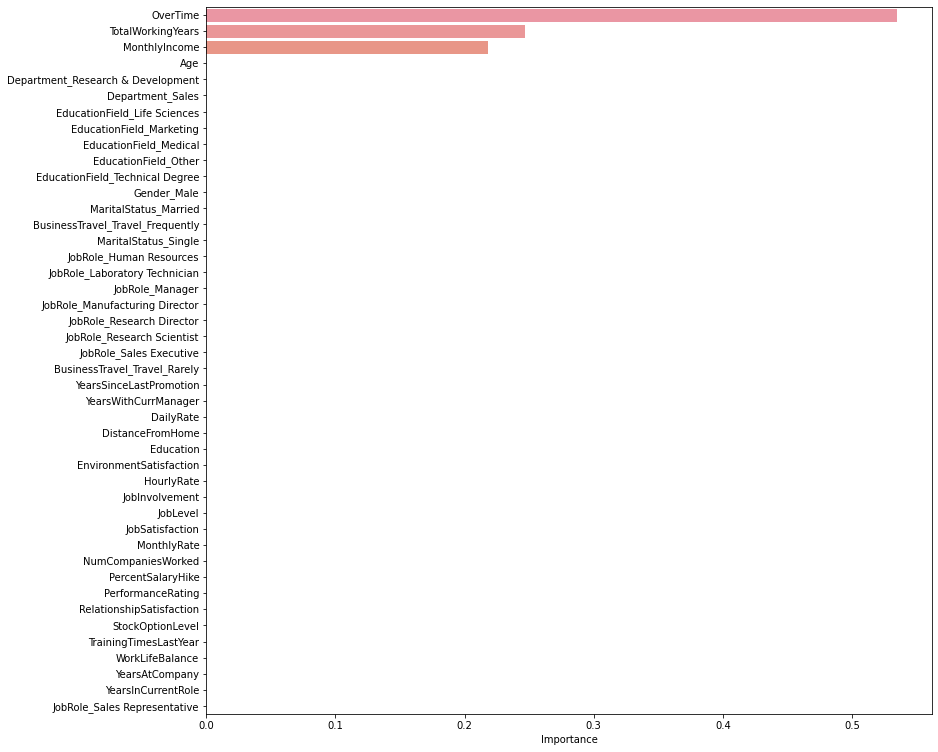

In [50]:
importances = dtree_estimator_rcv.feature_importances_
columns = X.columns

importance_df = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)
plt.figure(figsize = (13, 13))
sns.barplot(importance_df.Importance, importance_df.index)

## **GridSearchCV**

### **Building the Random Forest Classifier**

**Random Forest is a bagging algorithm where the base models are Decision Trees.** Samples are taken from the training data and on each sample, a decision tree makes a prediction. 

**The results from all the decision trees are combined and the final prediction is made using voting (for classification problems) or averaging (for regression problems).**

In [51]:
# Fitting the Random Forest classifier on the training data
rf_estimator = RandomForestClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1)

rf_estimator.fit(x_train, y_train)

RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1726
           1       1.00      1.00      1.00       332

    accuracy                           1.00      2058
   macro avg       1.00      1.00      1.00      2058
weighted avg       1.00      1.00      1.00      2058



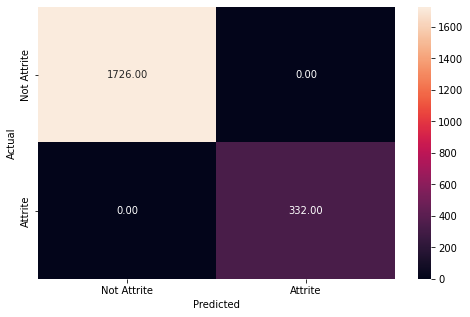

In [52]:
# Checking performance on the training data
y_pred_train_rf = rf_estimator.predict(x_train)

metrics_score(y_train, y_pred_train_rf)

**Observation:**

- The Random Forest is giving a **100% score for all metrics on the training dataset.** 

              precision    recall  f1-score   support

           0       0.96      0.99      0.98       740
           1       0.97      0.79      0.87       142

    accuracy                           0.96       882
   macro avg       0.96      0.89      0.92       882
weighted avg       0.96      0.96      0.96       882



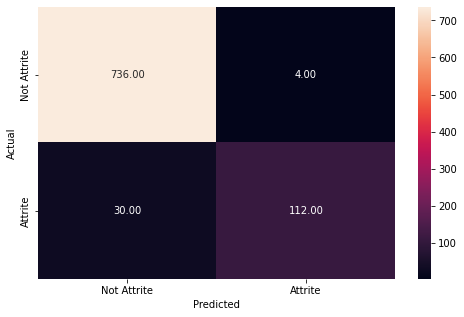

In [53]:
# Checking performance on the testing data
y_pred_test_rf = rf_estimator.predict(x_test)

metrics_score(y_test, y_pred_test_rf)

In [54]:
rf_estimator_test = model_performance_classification(rf_estimator,x_test,y_test)
rf_estimator_test

,Precision,Recall,Accuracy
0,0.963176,0.891663,0.961451


**Observations:**

- The Random Forest classifier **seems to be overfitting the training data**. The recall on the training data is 1, while the recall on the test data is only ~ 0.80 for class 1.
- Precision is high for the test data as well. 

**Let's check the feature importance of the Random Forest**

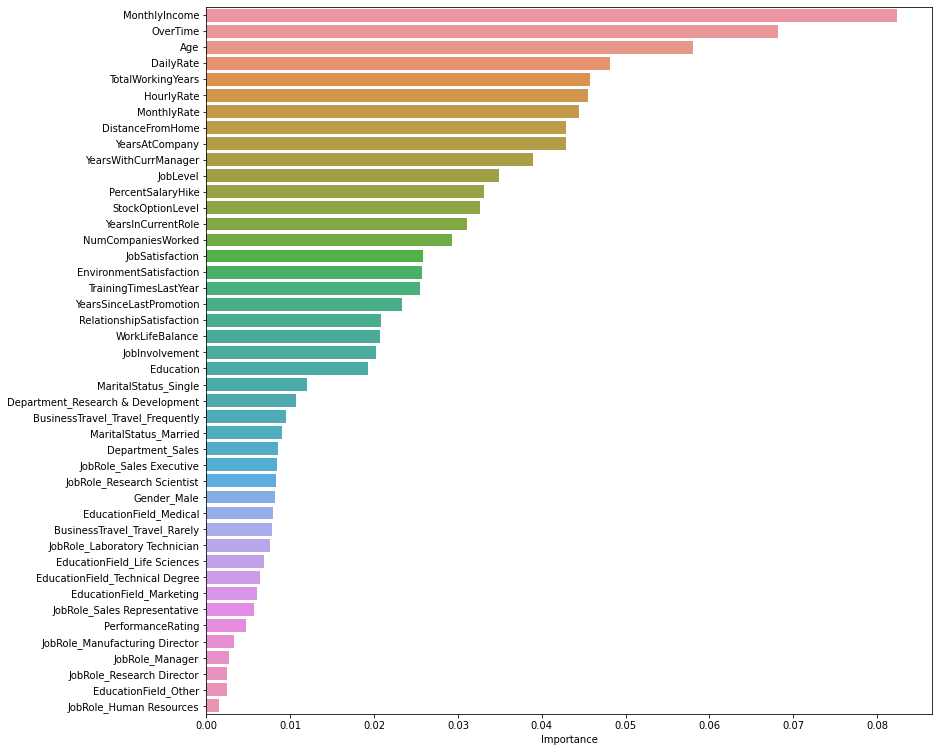

In [55]:
importances = rf_estimator.feature_importances_

columns = X.columns
importance_df = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)
plt.figure(figsize = (13, 13))
sns.barplot(importance_df.Importance, importance_df.index)

**Observations:**


- The Random Forest further verifies the results from the decision tree that the most important features are `MonthlyIncome`, `Age`, `OverTime`.
- We can say that the people appear to be leaving the organization because of the overtime they are doing andh s because they are not paid accordingly. These might be mostly junior-level and mid-level employees with less experience. 
- Distance from home is also a key feature, probably as employees living far from the office have to travel a lot, making their schedules hectic.
- Not having stock options is also a driver for attrition - this feature seems to have good importance in both the decision tree and random forest models. This could be related to the junior level employees and their lack of stock options - with the additional burden of a lower salary and working overtime, those without stock options could also be attriting more.
- Other features like, number of companies worked and percent salary hike also seem to be intuitive in explaining attrition likelihood, as people who have worked in a large number of companies are probably not going to stay loyal to the current organization and may have a high risk of attrition, while if an employee is not getting enough of a salary hike, that might demotivate them and lead to a higher likelihood of attriting as well.
- Other features such as job satisfaction, environment satisfaction and their job level also play a crucial role in knowing whether an employee will attrite or not.

### **Tuning the Random Forest classifier**

**n_estimators**: The number of trees in the forest.

**min_samples_split**: The minimum number of samples required to split an internal node.

**min_samples_leaf**: The minimum number of samples required to be at a leaf node. 

**max_features{“auto”, “sqrt”, “log2”, 'None'}**: The number of features to consider when looking for the best split.

- If “auto”, then max_features=sqrt(n_features).

- If “sqrt”, then max_features=sqrt(n_features) (same as “auto”).

- If “log2”, then max_features=log2(n_features).

- If None, then max_features=n_features.

In [56]:
# Choose the type of classifier
rf_estimator_tuned = RandomForestClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1)

# Grid of parameters to choose from
params_rf = {  
        "n_estimators": [100, 250, 500],
        "min_samples_leaf": np.arange(1, 4, 1),
        "max_features": [0.7, 0.9, 'auto'],
}


# Type of scoring used to compare parameter combinations - recall score for class 1
scorer = metrics.make_scorer(recall_score, pos_label = 1)

# Run the grid search
grid_obj = GridSearchCV(rf_estimator_tuned, params_rf, scoring = scorer, cv = 5)

grid_obj = grid_obj.fit(x_train, y_train)

# Set the classifier to the best combination of parameters
rf_estimator_tuned = grid_obj.best_estimator_

In [57]:
rf_estimator_tuned.fit(x_train, y_train)

RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, max_features=0.9,
                       min_samples_leaf=3, n_estimators=250, random_state=1)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1726
           1       0.99      1.00      1.00       332

    accuracy                           1.00      2058
   macro avg       1.00      1.00      1.00      2058
weighted avg       1.00      1.00      1.00      2058



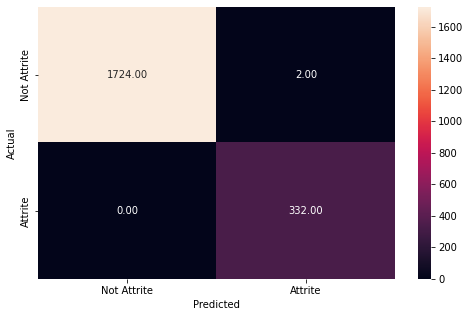

In [58]:
# Checking performance on the training data
y_pred_train_rf_tuned = rf_estimator_tuned.predict(x_train)

metrics_score(y_train, y_pred_train_rf_tuned)

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       740
           1       0.88      0.83      0.86       142

    accuracy                           0.95       882
   macro avg       0.92      0.90      0.91       882
weighted avg       0.95      0.95      0.95       882



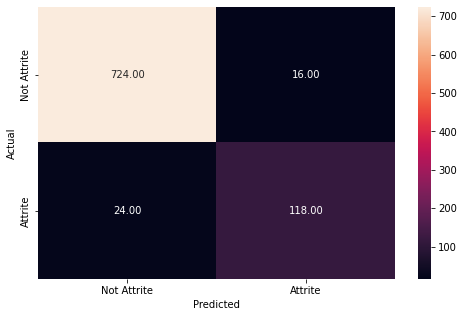

In [59]:
# Checking performance on the test data
y_pred_test_rf_tuned = rf_estimator_tuned.predict(x_test)

metrics_score(y_test, y_pred_test_rf_tuned)

In [60]:
rf_estimator_tuned_test = model_performance_classification(rf_estimator_tuned, x_test, y_test)
rf_estimator_tuned_test

,Precision,Recall,Accuracy
0,0.924256,0.904682,0.954649


**Observations:**

- The tuned model is also slightly overfitting the training dataset, but **it shows a good performance on the test dataset.**
- **The recall for class 1 has improved with a small decrease in precision**. 
- **This model is the best-performing one among all the models so far,** and is giving us good precision and recall scores on the test dataset.

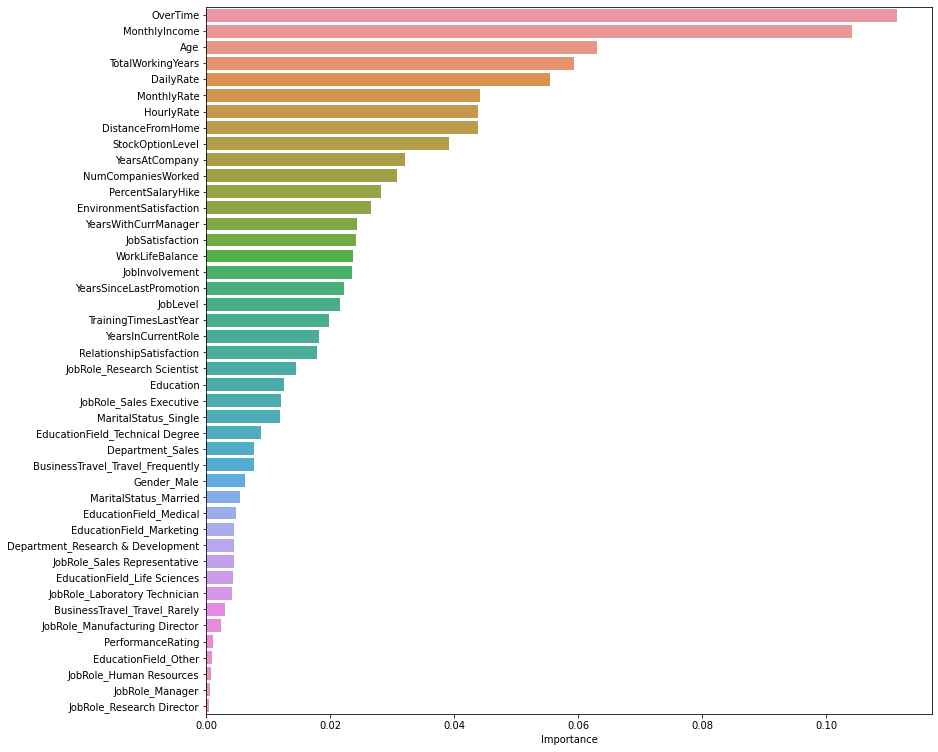

In [61]:
# Plotting feature importance
importances = rf_estimator_tuned.feature_importances_

columns = X.columns
importance_df = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)
plt.figure(figsize = (13, 13))
sns.barplot(importance_df.Importance, importance_df.index)

**Observations:**

- **The feature importance plot for the base model and tuned model are quite similar.** The model seems to suggest that `OverTime`, `MonthlyIncome`, `Age`,`TotalWorkingYears`, and `DailyRate` are the most important features.
- Other important features are DistanceFromHome, StockOptionLevel, YearsAt Company, and NumCompaniesWorked.

## **Conclusion**

- The best model we have got so far is the tuned random forest model which is giving nearly ~ 83% recall for class 1 on the test data. 
- The company should use this model to know beforehand which employee is going to attrite and act accordingly. 
- Overtime, MonthlyIncome, DailyRate, number of companies worked, and work experience/age seem to be the most important features.

## **Recommendations**

- We saw that **working overtime is the most important driver of attrition.** The organization should manage their work more efficiently so that employees don't have to work overtime and can manage to have a work-life balance, failing to do this, the company could provide some additional incentives to employees who are working overtime in order to retain them.
- **A higher monthly income might lower the odds of an employee attriting.** The company should make sure that all its employees are compensated at least based on industry standards.
- As observed earlier, the organization has a lower **percentage salary hike** and promotions are given less frequently. The company might be able to focus on **giving promotions more frequently** or they could **increase the annual appraisal hike** to incentivize employees to stay.
- The organization could come up with a **revised CTC plan with stock options for the employees** in order to keep them motivated and invested in the company's performance. 
- The organization should also modify its hiring policy as people who have worked in many companies and have switched a lot, should not be hired very often.
- Distance from home is also an important factor for attrition. Employees traveling a larger distance to reach the workplace are the ones attriting. For such employees, the company can provide cab facilities so that the commute of employees gets easier.
- The company should also keep track of the hourly rate or the daily rate, so that when the employees need to stay overtime for extra work they are well compensated for that.
- The organization should focus on improving the culture and environment at the workplace by coming up with new ideas to make the environment more open and friendly.
- Keeping track of the problems which employees with lesser experience face and how the management can help them, will create a healthy environment for the young employees.
- The organization should also focus on the employees who are working in sales and marketing, as attrition rate is quite high for these departments. Perhaps the company could look into their incentive schemes and try to come up with new incentive methods to motivate them to stay.

## **Additional Content (Optional)**

## **Boosting Models**

Let's now look at the other kind of Ensemble technique knowns as Boosting

### **XGBoost**
- XGBoost stands for Extreme Gradient Boosting.
- XGBoost is a tree-based ensemble machine learning technique that improves prediction power and performance by improvising on the Gradient Boosting framework and incorporating reliable approximation algorithms. It is widely utilized and routinely appears at the top of competition leader boards in data science.

In [62]:
# Installing the xgboost library using the 'pip' command.
#!pip install xgboost

In [63]:
# Importing the AdaBoostClassifier and GradientBoostingClassifier [Boosting]
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

# Importing the XGBClassifier from the xgboost library
from xgboost import XGBClassifier

In [64]:
# Adaboost Classifier
adaboost_model = AdaBoostClassifier(random_state = 1)

# Fitting the model
adaboost_model.fit(x_train, y_train)

# Model Performance on the test data
adaboost_model_perf_test = model_performance_classification(adaboost_model,x_test,y_test)


adaboost_model_perf_test

,Precision,Recall,Accuracy
0,0.814518,0.709136,0.884354


In [65]:
# Gradient Boost Classifier
gbc = GradientBoostingClassifier(random_state = 1)

# Fitting the model
gbc.fit(x_train, y_train)

# Model Performance on the test data
gbc_perf_test = model_performance_classification(gbc, x_test, y_test)

gbc_perf_test

,Precision,Recall,Accuracy
0,0.882845,0.728483,0.902494


In [66]:
# XGBoost Classifier
xgb = XGBClassifier(random_state = 1, eval_metric = 'logloss')

# Fitting the model
xgb.fit(x_train,y_train)

# Model Performance on the test data
xgb_perf_test = model_performance_classification(xgb,x_test,y_test)

xgb_perf_test

,Precision,Recall,Accuracy
0,0.910274,0.724819,0.905896


### **Hyperparameter Tuning: Boosting**

Hyperparameter tuning is a great technique in machine learning to develop the model with optimal parameters. If the size of the data increases, the computation time will increase during the training process.
- For practice purposes, we have listed below some of the important hyperparameters for each algorithm that can be tuned to improve the model performance.

**1. Adaboost**

- - Some important hyperparameters that can be tuned:

 - **base_estimator** object, default = None
The base estimator from which the boosted ensemble is built. Support for sample weighting is required, as well as proper classes_ and n_classes_ attributes. If None, then the base estimator is DecisionTreeClassifier initialized with max_depth=1

  - **n_estimators** int, default = 50
  The maximum number of estimators at which boosting is terminated. In the case of a perfect fit, the learning procedure is stopped early.

 - **learning_rate** float, default = 1.0
Weight is applied to each classifier at each boosting iteration. A higher learning rate increases the contribution of each classifier.

For a better understanding of each parameter in the AdaBoost classifier, please refer to this[source](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html).

**2. Gradient Boosting Algorithm**

- - Some important hyperparameters that can be tuned:

 - **n_estimators**: The number of boosting stages that will be performed.
 
 - **max_depth**: Limits the number of nodes in the tree. The best value depends on the interaction of the input variables.

  - **min_samples_split**: The minimum number of samples required to split an internal node.

  - **learning_rate**: How much the contribution of each tree will shrink.

  - **loss**:Loss function to optimize. 

For a better understanding of each parameter in the Gradient Boosting classifier, please refer to this [source](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html).


**3. XGBoost Algorithm**

- - Some important hyperparameters that can be tuned:

 - **booster** [default = gbtree ] Which booster to use. Can be gbtree, gblinear, or dart; gbtree and dart use tree-based models while gblinear uses linear functions.
 
 - **min_child_weight** [default = 1]

   The minimum sum of instance weight (hessian) needed in a child. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.The larger min_child_weight is, the more conservative the algorithm will be.

  For a better understanding of each parameter in the XGBoost Classifier, please refer to this [source](https://xgboost.readthedocs.io/en/stable/parameter.html).

### **Comparison of all the models we have built so far**

In [67]:
models_test_comp_df = pd.concat(
    
    [    
    dtree_test.T, dtree_tuned_test.T,rf_estimator_test.T,
    rf_estimator_tuned_test.T, adaboost_model_perf_test.T,
    gbc_perf_test.T, xgb_perf_test.T
    ],
    
    axis = 1,
)

models_test_comp_df.columns = [
    "Decision Tree classifier",
    "Tuned Decision Tree classifier",
    "Random Forest classifier",
    "Tuned Random Forest classifier",
    "Adaboost classifier",
    "Gradientboost classifier",
    "XGBoost classifier"
]

print("Test performance comparison:")

Test performance comparison:


In [68]:
models_test_comp_df

,Decision Tree classifier,Tuned Decision Tree classifier,Random Forest classifier,Tuned Random Forest classifier,Adaboost classifier,Gradientboost classifier,XGBoost classifier
Precision,0.869464,0.597186,0.963176,0.924256,0.814518,0.882845,0.910274
Recall,0.898211,0.661743,0.891663,0.904682,0.709136,0.728483,0.724819
Accuracy,0.934240,0.695011,0.961451,0.954649,0.884354,0.902494,0.905896


**Observations:**

* **The Tuned Random Forest gives the best performance for this dataset.**
* **In boosting algorithms, XGBoost has given good score amoong other algorithms.**

## **Optional Material**

### **RandomizedSearchCV**

In [69]:
# Choose the type of classifier
rf_estimator_tuned = RandomForestClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1)

# Grid of parameters to choose from
params_rf = {  
        "n_estimators": [100, 250, 500],
        "min_samples_leaf": np.arange(1, 4, 1),
        "max_features": [0.7, 0.9, 'auto'],
}


# Type of scoring used to compare parameter combinations - recall score for class 1
scorer = metrics.make_scorer(recall_score, pos_label = 1)


#Calling RandomizedSearchCV
randomized_cv_obj = RandomizedSearchCV(estimator=rf_estimator_tuned, 
                                   param_distributions=params_rf, 
                                   n_iter=50, 
                                   n_jobs = -1, 
                                   scoring=scorer, 
                                   cv=10, 
                                   random_state=1)


# Fitting the RandomizedSearchCV search on the train data
randomized_cv_obj  = randomized_cv_obj.fit(x_train, y_train)

# Set the classifier to the best combination of parameters
rf_estimator_tuned = randomized_cv_obj.best_estimator_

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1726
           1       0.99      1.00      1.00       332

    accuracy                           1.00      2058
   macro avg       1.00      1.00      1.00      2058
weighted avg       1.00      1.00      1.00      2058



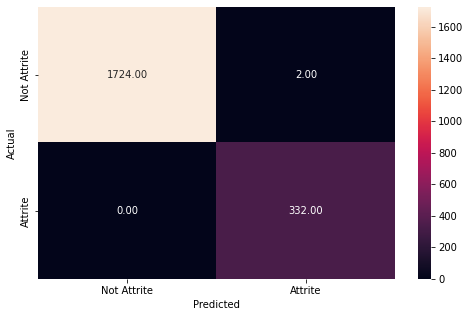

In [70]:
# Checking performance on the training data
y_pred_train_rf_tuned = rf_estimator_tuned.predict(x_train)

metrics_score(y_train, y_pred_train_rf_tuned)

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       740
           1       0.88      0.83      0.86       142

    accuracy                           0.95       882
   macro avg       0.92      0.90      0.91       882
weighted avg       0.95      0.95      0.95       882



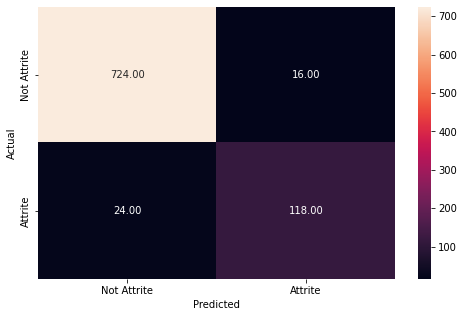

In [71]:
# Checking performance on the test data
y_pred_test_rf_tuned = rf_estimator_tuned.predict(x_test)

metrics_score(y_test, y_pred_test_rf_tuned)

In [72]:
rf_estimator_tuned_test = model_performance_classification(rf_estimator_tuned, x_test, y_test)
rf_estimator_tuned_test

,Precision,Recall,Accuracy
0,0.924256,0.904682,0.954649


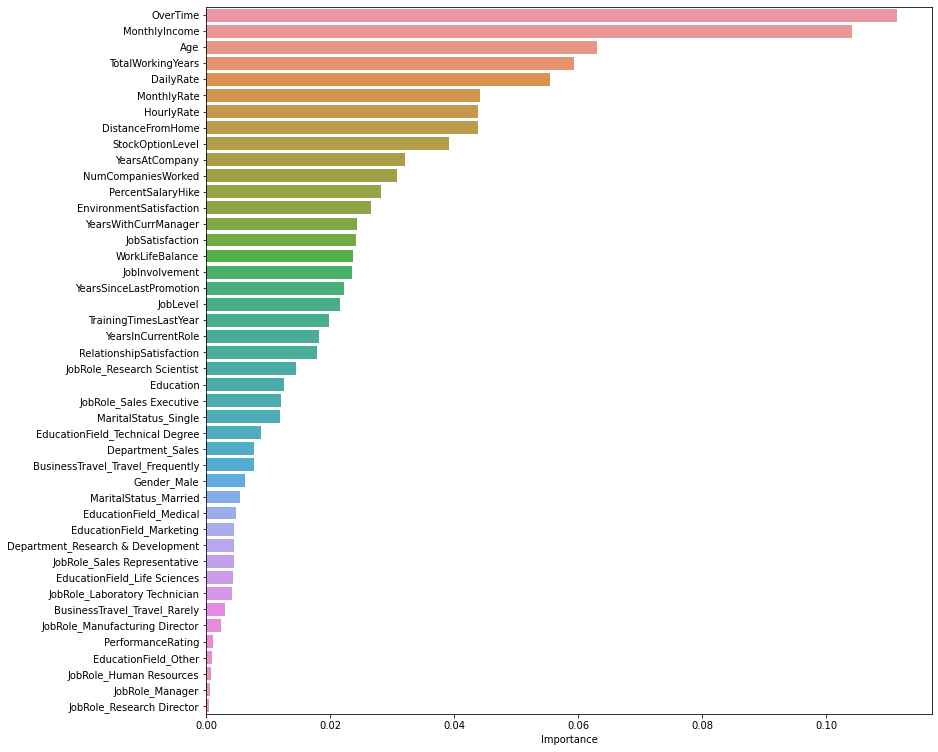

In [73]:
# Plotting feature importance
importances = rf_estimator_tuned.feature_importances_

columns = X.columns
importance_df = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)

plt.figure(figsize = (13, 13))
sns.barplot(importance_df.Importance, importance_df.index)

<a name= 'appendix'></a>
## **APPENDIX**

## **EDA**

### Summary of the dataset

In [74]:
eda_df = data.copy()

In [75]:
eda_df.describe().T

,count,mean,std,min,25%,50%,75%,max
EmployeeNumber,2940.0,1470.500000,848.849221,1.0,735.75,1470.5,2205.25,2940.0
Age,2940.0,36.923810,9.133819,18.0,30.00,36.0,43.00,60.0
DailyRate,2940.0,802.485714,403.440447,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,2940.0,9.192517,8.105485,1.0,2.00,7.0,14.00,29.0
Education,2940.0,2.912925,1.023991,1.0,2.00,3.0,4.00,5.0
EnvironmentSatisfaction,2940.0,2.721769,1.092896,1.0,2.00,3.0,4.00,4.0
HourlyRate,2940.0,65.891156,20.325969,30.0,48.00,66.0,84.00,100.0
JobInvolvement,2940.0,2.729932,0.711440,1.0,2.00,3.0,3.00,4.0
JobLevel,2940.0,2.063946,1.106752,1.0,1.00,2.0,3.00,5.0
JobSatisfaction,2940.0,2.728571,1.102658,1.0,2.00,3.0,4.00,4.0


## **Univariate analysis**

## **Data Science Machine Learning ToolKit Data Visualization Functions**

In [76]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

## **Helper Function**

## **Data Science Machine Learning ToolKit : Statistical Analysis**

In [77]:
import scipy.stats as stats
from scipy.stats import iqr
import numpy as np


def custom_stats_information(value, df):
    """
    custom_stats_information Helper Function
    
    parameter1 : value - DataFrame column name 
    parameter2 : df - DataFrame name
    
    Will print a summary of the following list of values below:
    - min
    - max
    - mean
    - median
    - std
    - mode
    - skew
    - IQR = Q3 - Q1
    - lower_outlier_gate_water_mark
    - upper_outlier_gate_water_mark
    - Q1 - 25%
    - Q2 - 50%  ==> median
    - Q3 - 75%
    
    Summary of Skewness**
    - mean = median = mode --> symmetric
    - mean > median > mode --> positive skewed RIGHT
    - mean < median < mode --> negative skewed LEFT
    """

    mode = list(df[value].mode())
    num_items_in_list = len(mode)

    q3 = df[value].quantile(0.75)
    q1 = df[value].quantile(0.25)
    q2_50 = df[value].quantile(0.50)

    iqr = q3 - q1

    # Q3 + 1.5 * IQR: upper outlier gate
    upper_outlier_water_mark_whisker = q3 + 1.5 * iqr

    # Q1 - 1.5 * IQR: lower outlier gate
    lower_outlier_water_mark_whisker = q1 - 1.5 * iqr

    if num_items_in_list == 1:
        print("{} has mode value: {}".format(value, mode[0]))
    else:
        print("{} has multi-mode value: {}".format(value, num_items_in_list))

    print(
        "{} min value is {:.2f}\n"
        "{} max value is {:.2f}\n"
        "{} mean value is {:.2f}\n"
        "{} median value is {:.2f}\n"
        "{} std value is {:.2f}\n"
        "{} mode value is {:.2f}  mode items {}\n"
        "{} skew value is {:.2f}\n"
        "{} IQR value is {:.2f}\n"
        "{} Lower outlier gate value is {:.2f}\n"
        "{} Outer outlier gate value is {:.2f}\n"
        "{} Q1_25 value is {:.2f}\n"
        "{} Q_50 value is {:.2f}\n"
        "{} Q3_75 value is {:.2f}".format(
            value,
            df[value].min(),
            value,
            df[value].max(),
            value,
            df[value].mean(),
            value,
            df[value].median(),
            value,
            df[value].std(),
            value,
            num_items_in_list,
            mode,
            value,
            df[value].skew(),
            value,
            iqr,
            value,
            lower_outlier_water_mark_whisker,
            value,
            upper_outlier_water_mark_whisker,
            value,
            q1,
            value,
            q2_50,
            value,
            q3,
        )
    )

In [78]:
num_cols

['DailyRate',
 'Age',
 'DistanceFromHome',
 'MonthlyIncome',
 'MonthlyRate',
 'PercentSalaryHike',
 'TotalWorkingYears',
 'YearsAtCompany',
 'NumCompaniesWorked',
 'HourlyRate',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'TrainingTimesLastYear']

### Observations on DailyRate

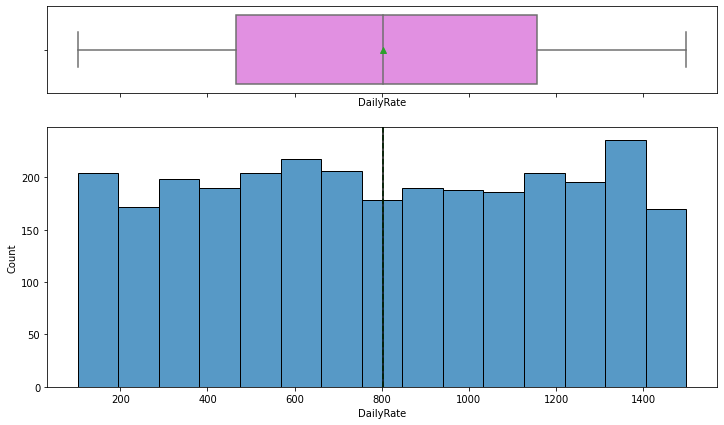

In [79]:
histogram_boxplot(eda_df,'DailyRate')

In [80]:
custom_stats_information("DailyRate", eda_df)

DailyRate has mode value: 691
DailyRate min value is 102.00
DailyRate max value is 1499.00
DailyRate mean value is 802.49
DailyRate median value is 802.00
DailyRate std value is 403.44
DailyRate mode value is 1.00  mode items [691]
DailyRate skew value is -0.00
DailyRate IQR value is 692.00
DailyRate Lower outlier gate value is -573.00
DailyRate Outer outlier gate value is 2195.00
DailyRate Q1_25 value is 465.00
DailyRate Q_50 value is 802.00
DailyRate Q3_75 value is 1157.00


* The daily rate has a fairly uniform distribution with a mean and median at 800.
* There are no outliers in the distribution

### Observations on Age

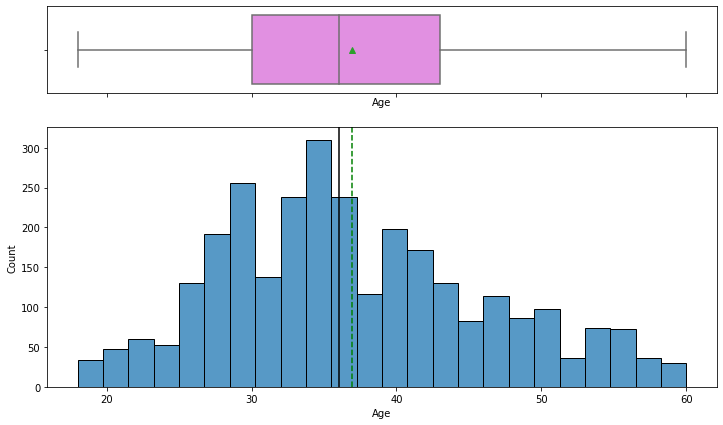

In [81]:
histogram_boxplot(eda_df,'Age')

In [82]:
custom_stats_information("Age", eda_df)

Age has mode value: 35
Age min value is 18.00
Age max value is 60.00
Age mean value is 36.92
Age median value is 36.00
Age std value is 9.13
Age mode value is 1.00  mode items [35]
Age skew value is 0.41
Age IQR value is 13.00
Age Lower outlier gate value is 10.50
Age Outer outlier gate value is 62.50
Age Q1_25 value is 30.00
Age Q_50 value is 36.00
Age Q3_75 value is 43.00


* Age is looking normally distributed, with a hint of right skew.

### Observations on DistanceFromHome

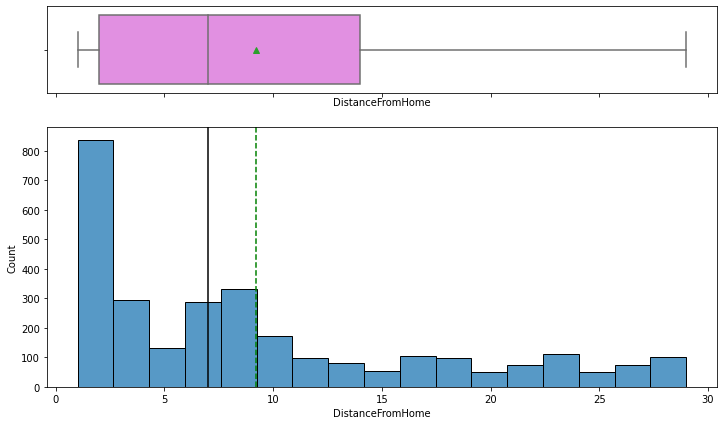

In [83]:
histogram_boxplot(eda_df,'DistanceFromHome')

In [84]:
custom_stats_information("DistanceFromHome", eda_df)

DistanceFromHome has mode value: 2
DistanceFromHome min value is 1.00
DistanceFromHome max value is 29.00
DistanceFromHome mean value is 9.19
DistanceFromHome median value is 7.00
DistanceFromHome std value is 8.11
DistanceFromHome mode value is 1.00  mode items [2]
DistanceFromHome skew value is 0.96
DistanceFromHome IQR value is 12.00
DistanceFromHome Lower outlier gate value is -16.00
DistanceFromHome Outer outlier gate value is 32.00
DistanceFromHome Q1_25 value is 2.00
DistanceFromHome Q_50 value is 7.00
DistanceFromHome Q3_75 value is 14.00


* This is a right-skewed distribution.
* Most people live close to work but we do have some employees that live at a distance.

### Observations on HourlyRate

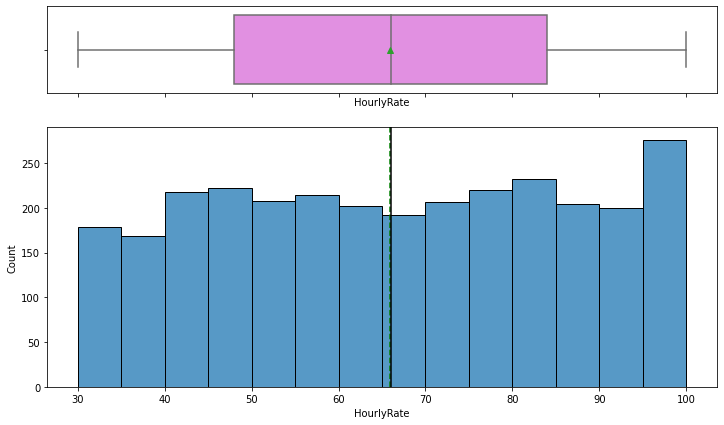

In [85]:
histogram_boxplot(eda_df,'HourlyRate')

In [86]:
custom_stats_information("HourlyRate", eda_df)

HourlyRate has mode value: 66
HourlyRate min value is 30.00
HourlyRate max value is 100.00
HourlyRate mean value is 65.89
HourlyRate median value is 66.00
HourlyRate std value is 20.33
HourlyRate mode value is 1.00  mode items [66]
HourlyRate skew value is -0.03
HourlyRate IQR value is 36.00
HourlyRate Lower outlier gate value is -6.00
HourlyRate Outer outlier gate value is 138.00
HourlyRate Q1_25 value is 48.00
HourlyRate Q_50 value is 66.00
HourlyRate Q3_75 value is 84.00


* Quite inline with the daily rate, the hourly rate is also fairly uniformly distributed with mean and median at 65.
  - slightly left skewed

### Observations on MonthlyIncome

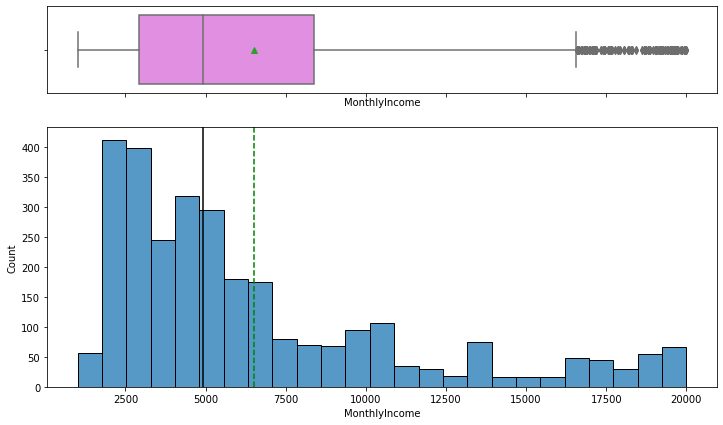

In [87]:
histogram_boxplot(eda_df,'MonthlyIncome')

In [88]:
custom_stats_information("MonthlyIncome", eda_df)

MonthlyIncome has mode value: 2342
MonthlyIncome min value is 1009.00
MonthlyIncome max value is 19999.00
MonthlyIncome mean value is 6502.93
MonthlyIncome median value is 4919.00
MonthlyIncome std value is 4707.16
MonthlyIncome mode value is 1.00  mode items [2342]
MonthlyIncome skew value is 1.37
MonthlyIncome IQR value is 5469.00
MonthlyIncome Lower outlier gate value is -5292.50
MonthlyIncome Outer outlier gate value is 16583.50
MonthlyIncome Q1_25 value is 2911.00
MonthlyIncome Q_50 value is 4919.00
MonthlyIncome Q3_75 value is 8380.00


* Income distribution across a unit is almost always right-skewed and similar is the case here.
* As expected, from the boxplot we can see that there are a few outliers who earn much higher than the rest of the employees.

### Observations on MonthlyRate

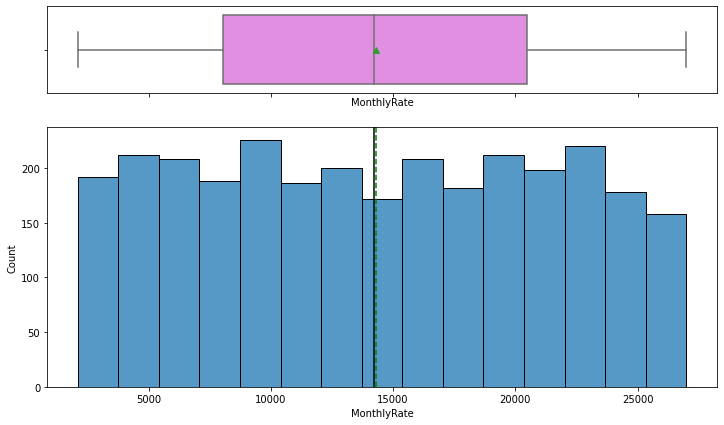

In [89]:
histogram_boxplot(eda_df,'MonthlyRate')

In [90]:
custom_stats_information("MonthlyRate", eda_df)

MonthlyRate has multi-mode value: 2
MonthlyRate min value is 2094.00
MonthlyRate max value is 26999.00
MonthlyRate mean value is 14313.10
MonthlyRate median value is 14235.50
MonthlyRate std value is 7116.58
MonthlyRate mode value is 2.00  mode items [4223, 9150]
MonthlyRate skew value is 0.02
MonthlyRate IQR value is 12417.00
MonthlyRate Lower outlier gate value is -10580.50
MonthlyRate Outer outlier gate value is 39087.50
MonthlyRate Q1_25 value is 8045.00
MonthlyRate Q_50 value is 14235.50
MonthlyRate Q3_75 value is 20462.00


* Monthly rate also has a uniform distribution with mean and median close to 14500.

### Observations on NumCompaniesWorked

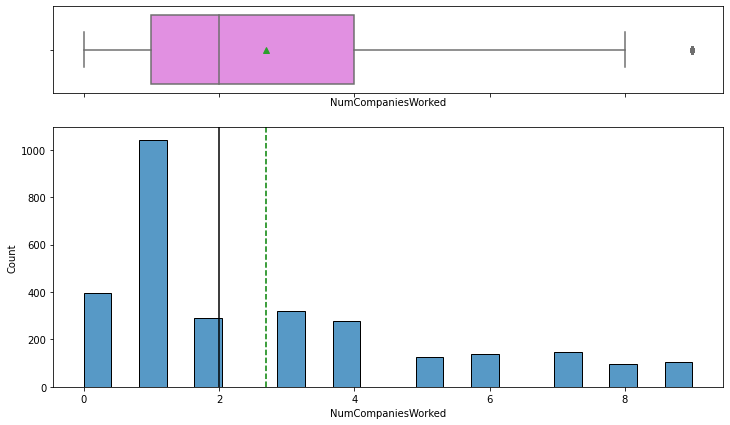

In [91]:
histogram_boxplot(eda_df,'NumCompaniesWorked')

In [92]:
custom_stats_information("NumCompaniesWorked", eda_df)

NumCompaniesWorked has mode value: 1
NumCompaniesWorked min value is 0.00
NumCompaniesWorked max value is 9.00
NumCompaniesWorked mean value is 2.69
NumCompaniesWorked median value is 2.00
NumCompaniesWorked std value is 2.50
NumCompaniesWorked mode value is 1.00  mode items [1]
NumCompaniesWorked skew value is 1.03
NumCompaniesWorked IQR value is 3.00
NumCompaniesWorked Lower outlier gate value is -3.50
NumCompaniesWorked Outer outlier gate value is 8.50
NumCompaniesWorked Q1_25 value is 1.00
NumCompaniesWorked Q_50 value is 2.00
NumCompaniesWorked Q3_75 value is 4.00


* On average, people have worked at 2.5 companies. Median is 2.
* Most people have worked at only 1 company.
* Nearly 350 employees have worked at 0 companies, clearly this means this variable indicates the number of companies worked at before joining ours.
* There is an outlier employee who has changed 9 companies.

### Observations on PercentSalaryHike

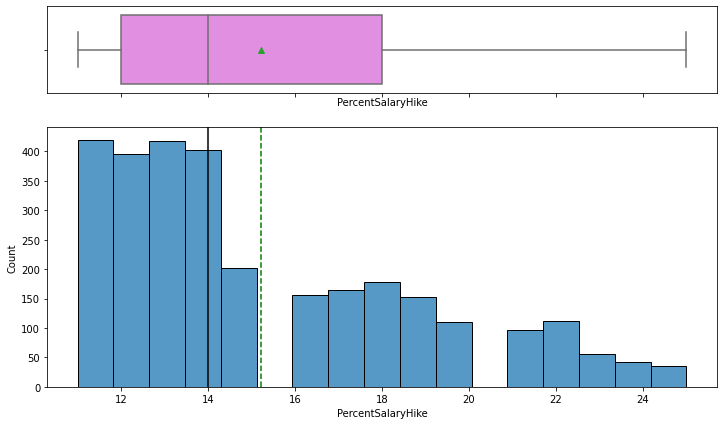

In [93]:
histogram_boxplot(eda_df,'PercentSalaryHike')

In [94]:
custom_stats_information("PercentSalaryHike", eda_df)

PercentSalaryHike has mode value: 11
PercentSalaryHike min value is 11.00
PercentSalaryHike max value is 25.00
PercentSalaryHike mean value is 15.21
PercentSalaryHike median value is 14.00
PercentSalaryHike std value is 3.66
PercentSalaryHike mode value is 1.00  mode items [11]
PercentSalaryHike skew value is 0.82
PercentSalaryHike IQR value is 6.00
PercentSalaryHike Lower outlier gate value is 3.00
PercentSalaryHike Outer outlier gate value is 27.00
PercentSalaryHike Q1_25 value is 12.00
PercentSalaryHike Q_50 value is 14.00
PercentSalaryHike Q3_75 value is 18.00


* Salary hike is Right skewed. We shall check later if the hike percentage is a function of performance rating or job level. 
* Mean percentage salary hike is 15%.

### Observations on TotalWorkingYears

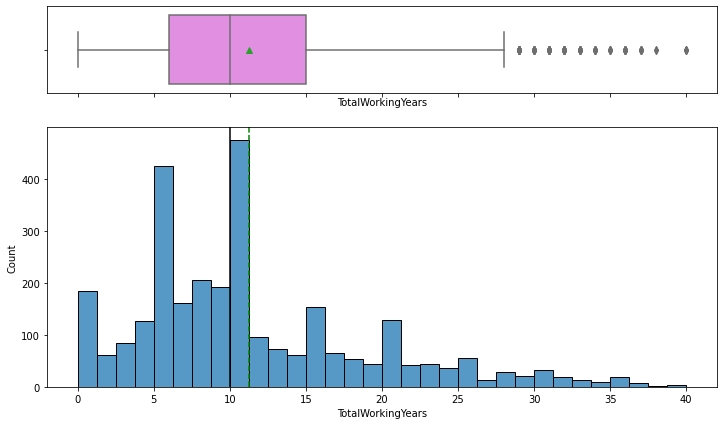

In [95]:
histogram_boxplot(eda_df,'TotalWorkingYears')

In [96]:
custom_stats_information("TotalWorkingYears", eda_df)

TotalWorkingYears has mode value: 10
TotalWorkingYears min value is 0.00
TotalWorkingYears max value is 40.00
TotalWorkingYears mean value is 11.28
TotalWorkingYears median value is 10.00
TotalWorkingYears std value is 7.78
TotalWorkingYears mode value is 1.00  mode items [10]
TotalWorkingYears skew value is 1.12
TotalWorkingYears IQR value is 9.00
TotalWorkingYears Lower outlier gate value is -7.50
TotalWorkingYears Outer outlier gate value is 28.50
TotalWorkingYears Q1_25 value is 6.00
TotalWorkingYears Q_50 value is 10.00
TotalWorkingYears Q3_75 value is 15.00


* Age of the employees had a hint of right skew but work experience has a significant right skew.
* From the boxplot, we can observe that this variable contains a few outliers also.

### Observations on YearsAtCompany

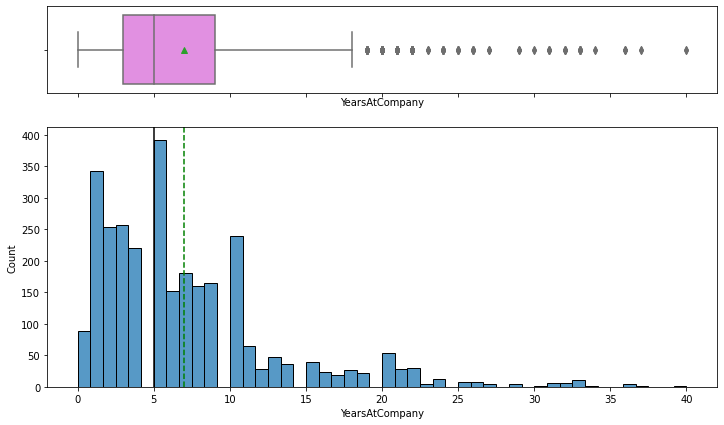

In [97]:
histogram_boxplot(eda_df,'YearsAtCompany')

In [98]:
custom_stats_information("YearsAtCompany", eda_df)

YearsAtCompany has mode value: 5
YearsAtCompany min value is 0.00
YearsAtCompany max value is 40.00
YearsAtCompany mean value is 7.01
YearsAtCompany median value is 5.00
YearsAtCompany std value is 6.13
YearsAtCompany mode value is 1.00  mode items [5]
YearsAtCompany skew value is 1.76
YearsAtCompany IQR value is 6.00
YearsAtCompany Lower outlier gate value is -6.00
YearsAtCompany Outer outlier gate value is 18.00
YearsAtCompany Q1_25 value is 3.00
YearsAtCompany Q_50 value is 5.00
YearsAtCompany Q3_75 value is 9.00


* Significant right skew in the data.
* The outliers are probably the most loyal employees and it suggests that they would be less likely to attrite.

### Observations on YearsInCurrentRole

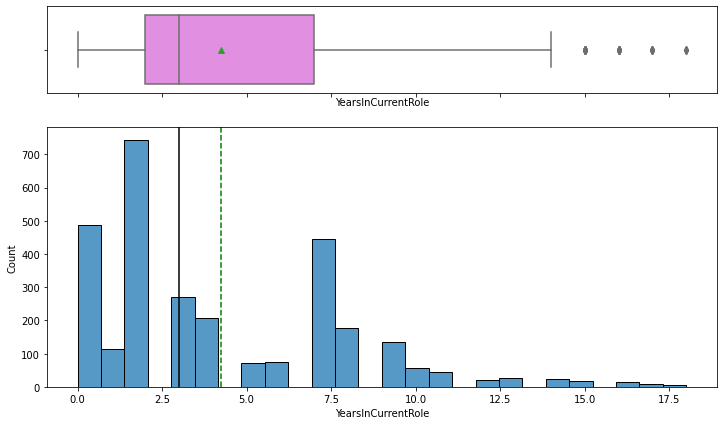

In [99]:
histogram_boxplot(eda_df,'YearsInCurrentRole')

In [100]:
custom_stats_information("YearsInCurrentRole", eda_df)

YearsInCurrentRole has mode value: 2
YearsInCurrentRole min value is 0.00
YearsInCurrentRole max value is 18.00
YearsInCurrentRole mean value is 4.23
YearsInCurrentRole median value is 3.00
YearsInCurrentRole std value is 3.62
YearsInCurrentRole mode value is 1.00  mode items [2]
YearsInCurrentRole skew value is 0.92
YearsInCurrentRole IQR value is 5.00
YearsInCurrentRole Lower outlier gate value is -5.50
YearsInCurrentRole Outer outlier gate value is 14.50
YearsInCurrentRole Q1_25 value is 2.00
YearsInCurrentRole Q_50 value is 3.00
YearsInCurrentRole Q3_75 value is 7.00


* This distribution has three peaks at 0, 2, and 7.
* There are a few outliers that have stayed in the same role for more than 15 years.

### Observations on YearsWithCurrManager

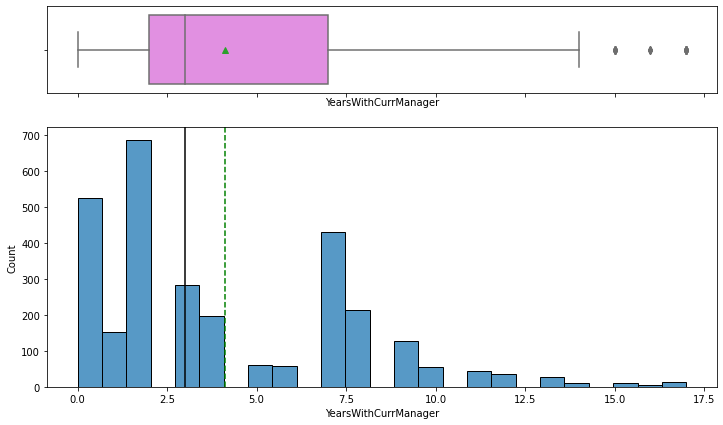

In [101]:
histogram_boxplot(eda_df,'YearsWithCurrManager')

In [102]:
custom_stats_information("YearsWithCurrManager", eda_df)

YearsWithCurrManager has mode value: 2
YearsWithCurrManager min value is 0.00
YearsWithCurrManager max value is 17.00
YearsWithCurrManager mean value is 4.12
YearsWithCurrManager median value is 3.00
YearsWithCurrManager std value is 3.57
YearsWithCurrManager mode value is 1.00  mode items [2]
YearsWithCurrManager skew value is 0.83
YearsWithCurrManager IQR value is 5.00
YearsWithCurrManager Lower outlier gate value is -5.50
YearsWithCurrManager Outer outlier gate value is 14.50
YearsWithCurrManager Q1_25 value is 2.00
YearsWithCurrManager Q_50 value is 3.00
YearsWithCurrManager Q3_75 value is 7.00


* This distribution is very similar to that of 'Years in current role' and that makes sense.
* There are a few outliers in this variable. 

## **Data Visualization Tools to Print Categorical Data**

In [103]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [104]:
# function to create labeled barplots with sorted values


def sort_values_labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

### Observations on BusinessTravel

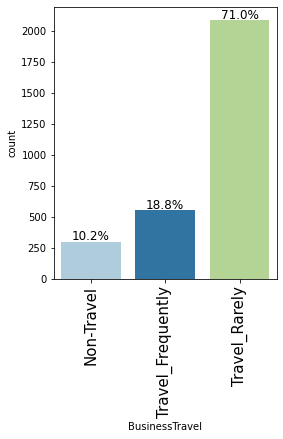

In [105]:
labeled_barplot(eda_df, "BusinessTravel", perc=True)

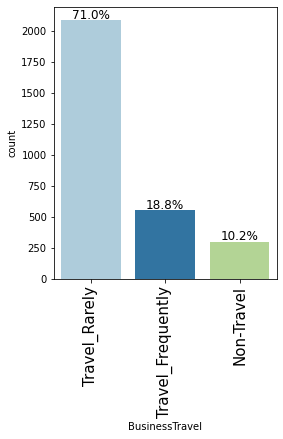

In [106]:
sort_values_labeled_barplot(eda_df, "BusinessTravel", perc=True)

* 71% of the employees have travel rarely and 18.8% employees have to travel frequently.

### Observations on Department

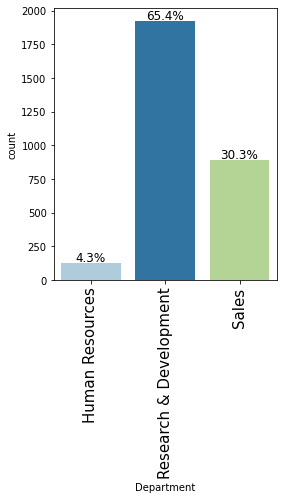

In [107]:
labeled_barplot(eda_df, "Department", perc=True)

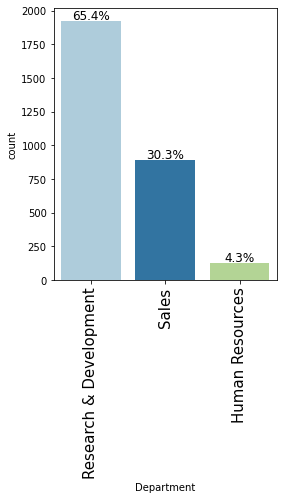

In [108]:
sort_values_labeled_barplot(eda_df, "Department", perc=True)

* 65.4% of employees in data are from R&D department followed by 30.3% in sales.

### Observations on EducationField

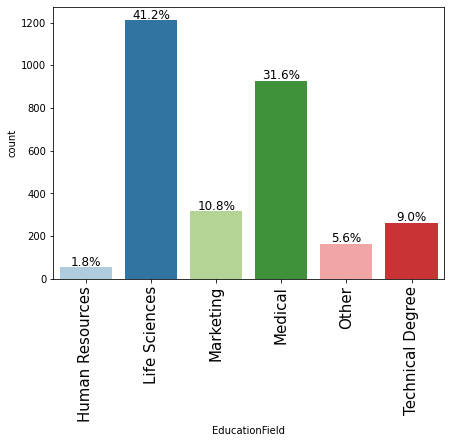

In [109]:
labeled_barplot(eda_df, "EducationField", perc=True)

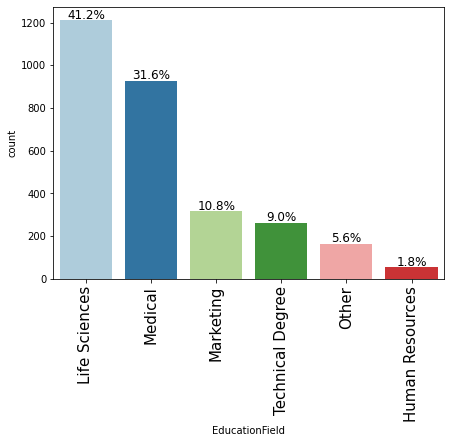

In [110]:
sort_values_labeled_barplot(eda_df, "EducationField", perc=True)

* 41.2% of the employees are from a Life Sciences background followed by 31.6% from a medical background.

### Observations on Gender

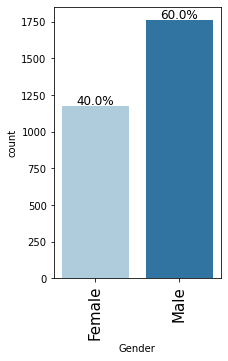

In [111]:
labeled_barplot(eda_df, "Gender", perc=True)

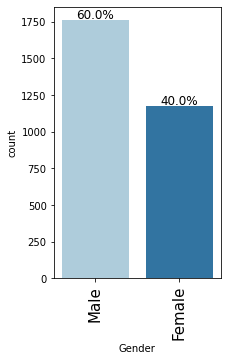

In [112]:
sort_values_labeled_barplot(eda_df, "Gender", perc=True)

* 60% of male employees and 40% of female employees.

### Observations on JobRole

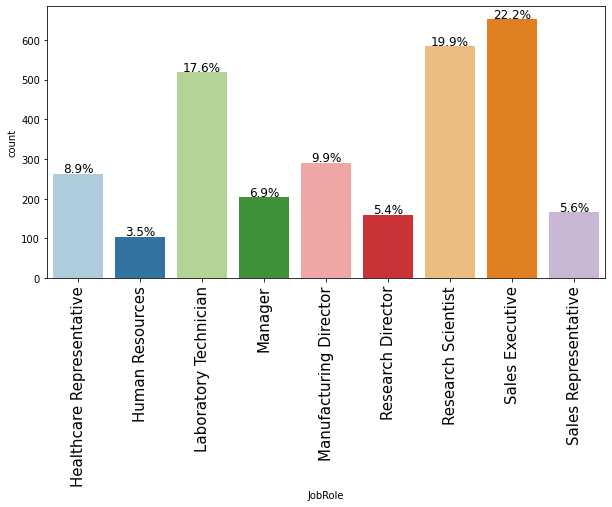

In [113]:
labeled_barplot(eda_df, "JobRole", perc=True)

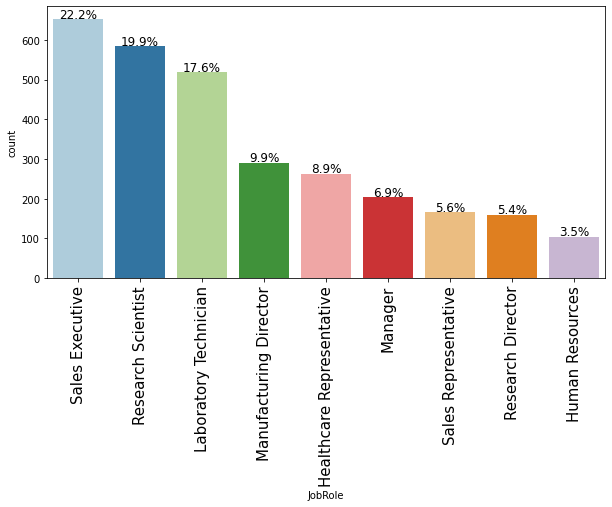

In [114]:
sort_values_labeled_barplot(eda_df, "JobRole", perc=True)

* 22.2% of employees are Sales Executives followed by 20% of Research Scientists.

### Observations on MaritalStatus

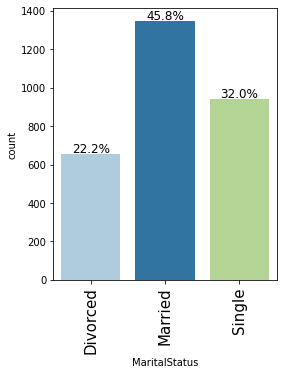

In [115]:
labeled_barplot(eda_df, "MaritalStatus", perc=True)

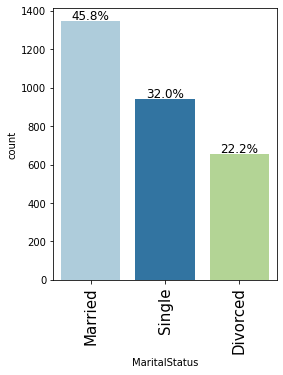

In [116]:
sort_values_labeled_barplot(eda_df, "MaritalStatus", perc=True)

* 45.8% of the employees are married followed by 32% singles.

### Observations on OverTime

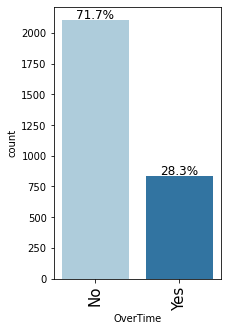

In [117]:
labeled_barplot(eda_df, "OverTime", perc=True)

* 71.7% of the employees are not ready to work over time.

### Observations on Attrition

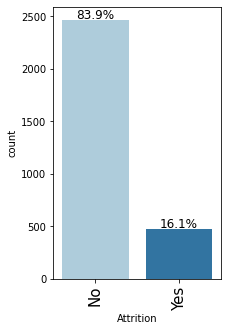

In [118]:
labeled_barplot(eda_df, "Attrition", perc=True)

* 16% of the data points represent the employees who are going to attrite.

## Bivariate Analysis

- You should ONLY perform a heatmap on continuous variables only
  - here there are a mix of continuous and categorical

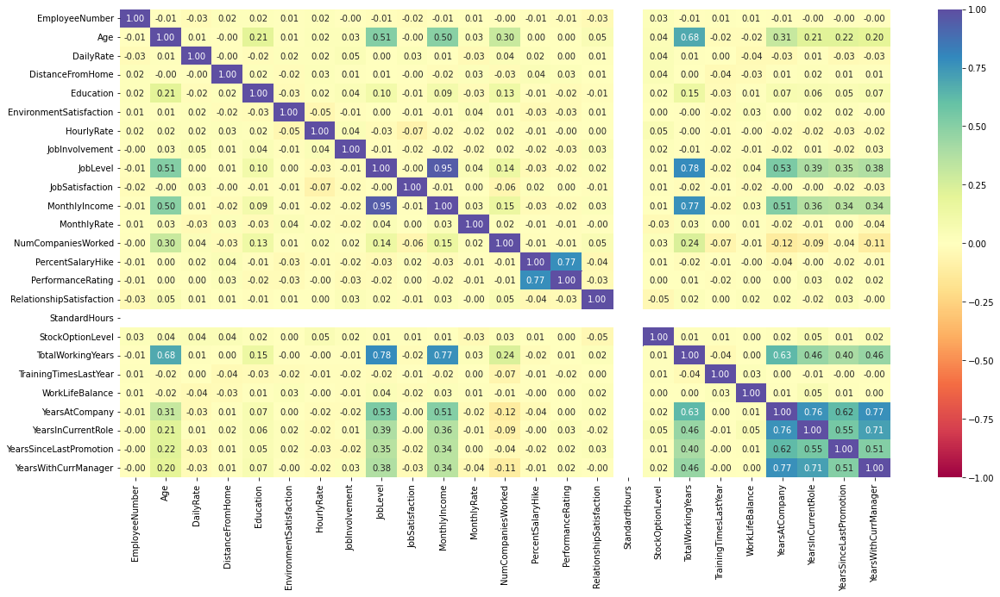

CPU times: user 2.5 s, sys: 314 ms, total: 2.82 s
Wall time: 2.62 s


In [119]:
%%time
plt.figure(figsize=(20,10))
sns.heatmap(eda_df.corr(),annot=True,vmin=-1,vmax=1,fmt='.2f',cmap="Spectral")
plt.show()

* There are a few variables that are correlated with each other but there are no surprises here.
* Unsurprisingly, TotalWorkingYears is highly correlated to Job Level (i.e., the longer you work the higher job level you achieve).
* HourlyRate, DailyRate, and MonthlyRate are completely uncorrelated with each other which makes it harder to understand what these variables might represent. 
* MonthlyIncome is highly correlated to Job Level.
* Age is positively correlated JobLevel and Education (i.e., the older an employee is, the more educated and at a higher job level they are).
* Work-life Balance is correlated with none of the numeric values.

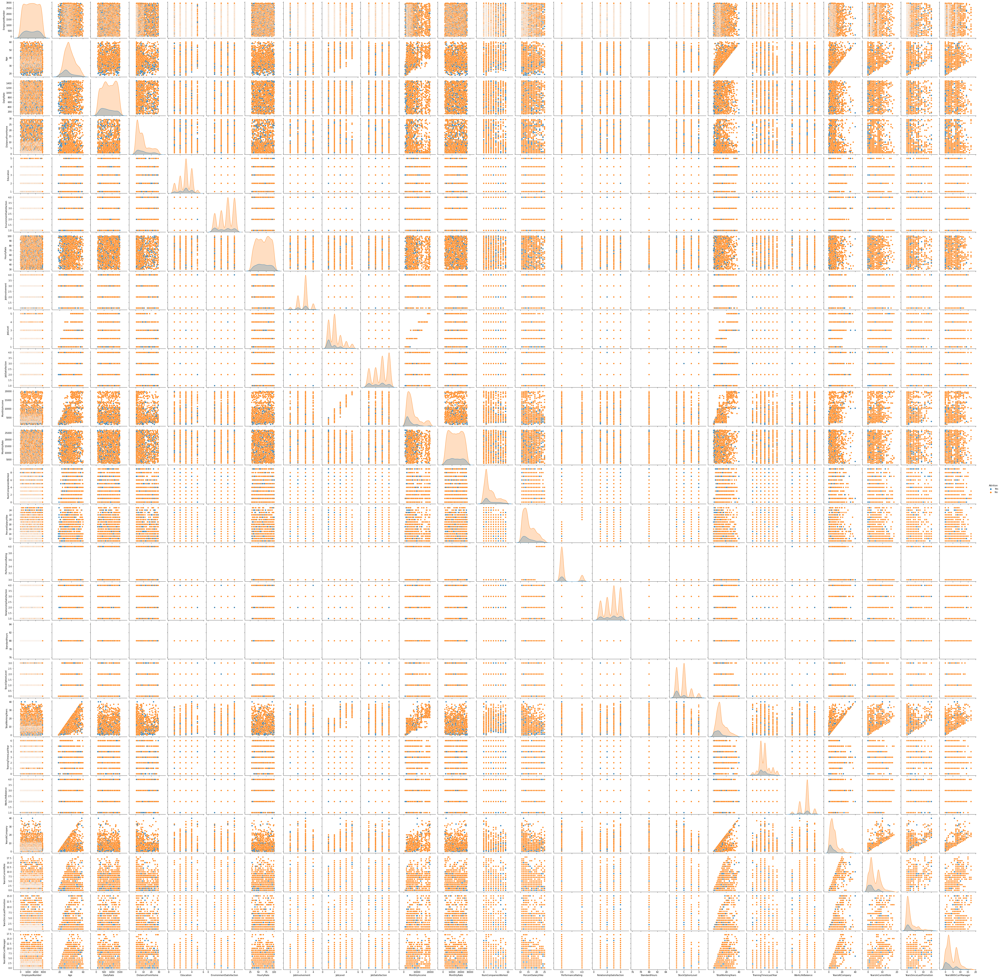

CPU times: user 9min 19s, sys: 12.6 s, total: 9min 32s
Wall time: 9min 18s


In [120]:
%%time
sns.pairplot(eda_df,hue='Attrition')
plt.show()

* We can see varying distributions in variables for Attrition, we should investigate it further.

### Attrition vs Earnings of employee

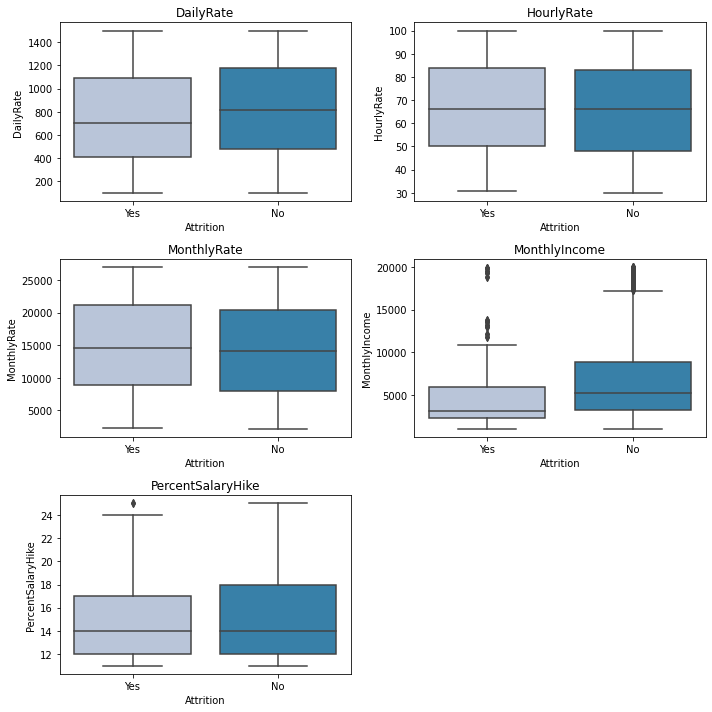

In [121]:
cols = eda_df[['DailyRate','HourlyRate','MonthlyRate','MonthlyIncome','PercentSalaryHike']].columns.tolist()
plt.figure(figsize=(10,10))

for i, variable in enumerate(cols):
                     plt.subplot(3,2,i+1)
                     sns.boxplot(eda_df["Attrition"],eda_df[variable],palette="PuBu")
                     plt.tight_layout()
                     plt.title(variable)
plt.show()

* Employees having lower Daily rate and less monthly wage are more likely to attrite.
* Monthly rate and the hourly rate doesn't seem to have any effect on attrition.
* Lesser salary hike also contributes to attrition.

### Attrition vs Years working in company

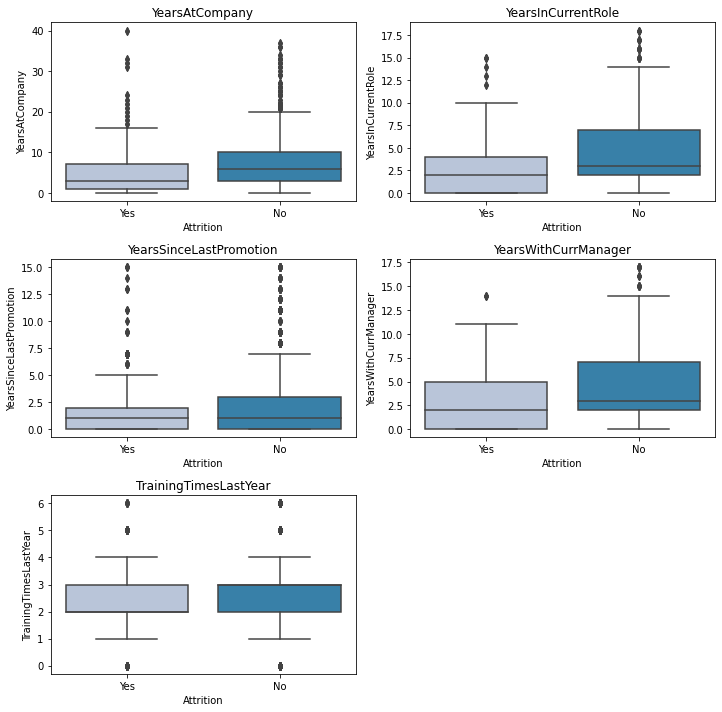

In [122]:
cols = eda_df[['YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager','TrainingTimesLastYear']].columns.tolist()
plt.figure(figsize=(10,10))

for i, variable in enumerate(cols):
                     plt.subplot(3,2,i+1)
                     sns.boxplot(eda_df["Attrition"],eda_df[variable],palette="PuBu")
                     plt.tight_layout()
                     plt.title(variable)
plt.show()

* Those employees who have spent less time at a company, in a current role or with a manager have higher chances of attriting.
* Training doesn't seem to have an impact on Attrition.

### Attrition vs Previous job roles

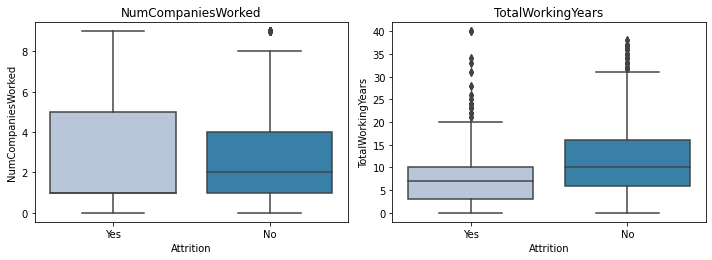

In [123]:
cols = eda_df[['NumCompaniesWorked','TotalWorkingYears']].columns.tolist()
plt.figure(figsize=(10,10))

for i, variable in enumerate(cols):
                     plt.subplot(3,2,i+1)
                     sns.boxplot(eda_df["Attrition"],eda_df[variable],palette="PuBu")
                     plt.tight_layout()
                     plt.title(variable)
plt.show()

* Employees who have worked in more companies generally tend to switch more jobs hence attriting.
* Employees who attrite generally have lesser years of experience.

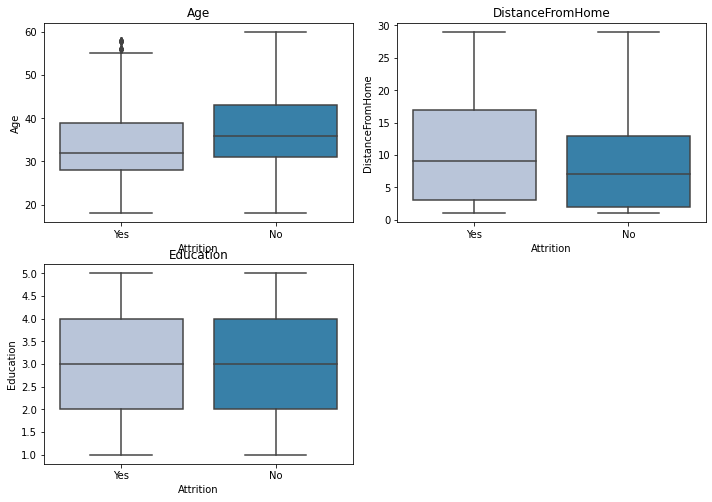

In [124]:
cols = eda_df[['Age','DistanceFromHome','Education']].columns.tolist()
plt.figure(figsize=(10,10))

for i, variable in enumerate(cols):
                     plt.subplot(3,2,i+1)
                     sns.boxplot(eda_df["Attrition"],eda_df[variable],palette="PuBu")
                     plt.tight_layout()
                     plt.title(variable)
plt.show()

* Employees who have to travel a more distance from their home attrite more.
* There is no difference in age and education of attriting and non-attriting employees.

## **Data Visualization Tools**

In [125]:
# function to plot stacked bar chart


def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left",
        frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

Attrition            No  Yes   All
BusinessTravel                    
All                2466  474  2940
Travel_Rarely      1774  312  2086
Travel_Frequently   416  138   554
Non-Travel          276   24   300
------------------------------------------------------------------------------------------------------------------------


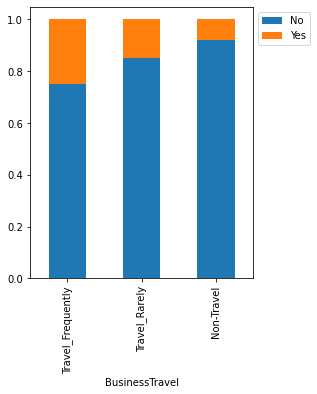

In [126]:
stacked_barplot(eda_df, "BusinessTravel", "Attrition")

* As the travel frequency increases, the Attrition rate increases.
* There's ~22% probability of employees attriting who travel frequently.

Attrition                 No  Yes   All
Department                             
All                     2466  474  2940
Research & Development  1656  266  1922
Sales                    708  184   892
Human Resources          102   24   126
------------------------------------------------------------------------------------------------------------------------


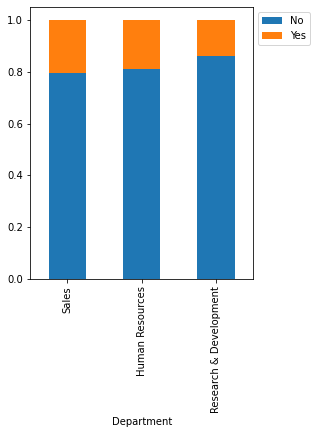

In [127]:
stacked_barplot(eda_df, "Department", "Attrition")

* We saw earlier that majority of the employees work for the R&D department. The probability of attrition is least there.
* Both Sales and HR have similar Attrition probability.

Attrition           No  Yes   All
EducationField                   
All               2466  474  2940
Life Sciences     1034  178  1212
Medical            802  126   928
Marketing          248   70   318
Technical Degree   200   64   264
Other              142   22   164
Human Resources     40   14    54
------------------------------------------------------------------------------------------------------------------------


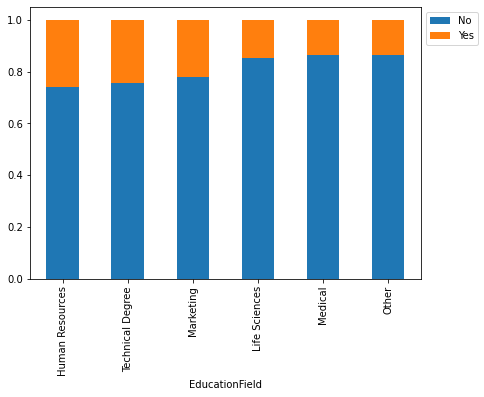

In [128]:
stacked_barplot(eda_df,"EducationField","Attrition")

* 25% of employees educated in human resources attrite.
* Attrition probability is also high in the case of marketing and technical degree holders.

Attrition                  No  Yes   All
EnvironmentSatisfaction                 
All                      2466  474  2940
1                         424  144   568
3                         782  124   906
4                         772  120   892
2                         488   86   574
------------------------------------------------------------------------------------------------------------------------


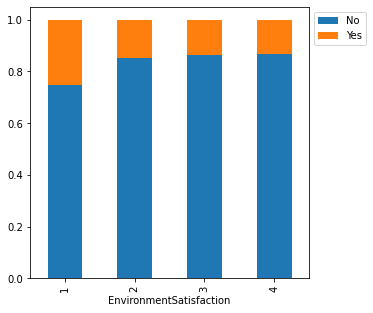

In [129]:
stacked_barplot(eda_df,"EnvironmentSatisfaction","Attrition")

* Employees who say they have low satisfaction with their work environments are likely to attrite.
* There's a ~40% probability of attrition among employees with low ratings for environment satisfaction.

Attrition         No  Yes   All
JobInvolvement                 
All             2466  474  2940
3               1486  250  1736
2                608  142   750
1                110   56   166
4                262   26   288
------------------------------------------------------------------------------------------------------------------------


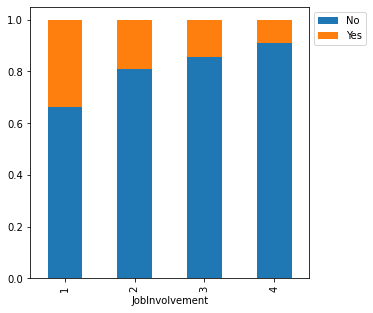

In [130]:
stacked_barplot(eda_df,"JobInvolvement","Attrition")

* Job Involvement looks like a very strong indicator of attrition.
* Higher the job involvement, greater is the chance that the employee will stay with us and not attrite.
* Employees unhappy with their job involment have ~55% probability of attriting (those who rated 0 and 1).
* Further investigation to understand how this variable was collected will give more insights.

Attrition    No  Yes   All
JobLevel                  
All        2466  474  2940
1           800  286  1086
2           964  104  1068
3           372   64   436
4           202   10   212
5           128   10   138
------------------------------------------------------------------------------------------------------------------------


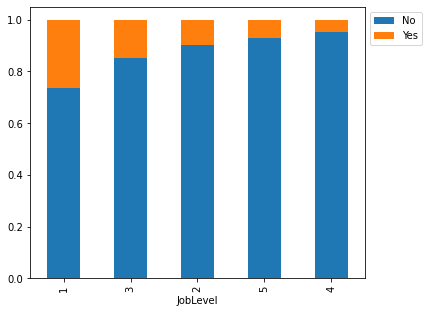

In [131]:
stacked_barplot(eda_df,"JobLevel","Attrition")

* The trend is not very clear here, but it is visible that people at lower job levels are more likely to attrite.

Attrition                    No  Yes   All
JobRole                                   
All                        2466  474  2940
Laboratory Technician       394  124   518
Sales Executive             538  114   652
Research Scientist          490   94   584
Sales Representative        100   66   166
Human Resources              80   24   104
Manufacturing Director      270   20   290
Healthcare Representative   244   18   262
Manager                     194   10   204
Research Director           156    4   160
------------------------------------------------------------------------------------------------------------------------


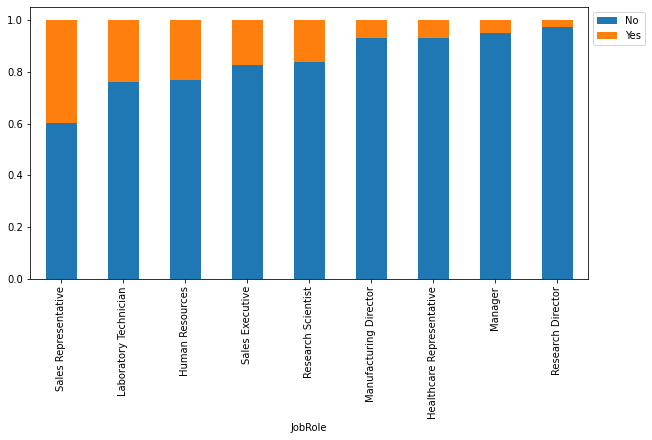

In [132]:
stacked_barplot(eda_df,"JobRole","Attrition")

* Sales Executives have an attrition probability of >40%.
* Laboratory Technicians and Human Resource personnel also have high probabilities of attrition.
* Attrition probability among Research Directors, Manufacturing directors Healthcare representatives, and Managers is much lower than the average attrition probability of 16%.

Attrition          No  Yes   All
JobSatisfaction                 
All              2466  474  2940
3                 738  146   884
1                 446  132   578
4                 814  104   918
2                 468   92   560
------------------------------------------------------------------------------------------------------------------------


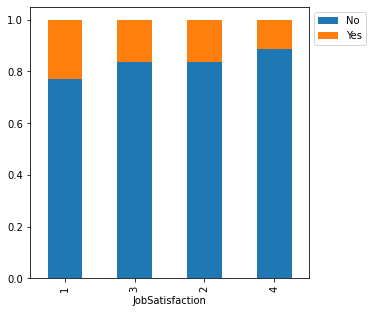

In [133]:
stacked_barplot(eda_df,"JobSatisfaction","Attrition")

* As Job satisfaction increases, attrition probability decreases. This is intuitive but the attrition probability of people who rate 2 and 3 being almost the same is peculiar.  

Attrition        No  Yes   All
MaritalStatus                 
All            2466  474  2940
Single          700  240   940
Married        1178  168  1346
Divorced        588   66   654
------------------------------------------------------------------------------------------------------------------------


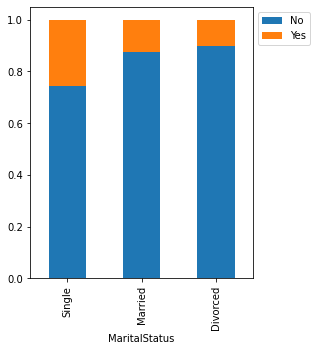

In [134]:
stacked_barplot(eda_df,"MaritalStatus","Attrition")

* Singles attrite more than married and divorced employees.
* One of the reasons here can be that single employees are younger and tend to explore different jobs.

Attrition    No  Yes   All
OverTime                  
All        2466  474  2940
Yes         578  254   832
No         1888  220  2108
------------------------------------------------------------------------------------------------------------------------


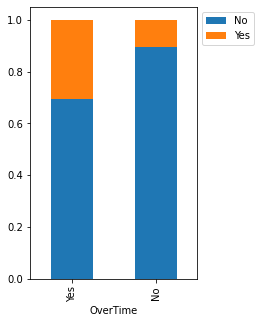

In [135]:
stacked_barplot(eda_df,"OverTime","Attrition")

* Employees who work overtime tend to attrite more.
* There a ~35% probability of attrition among employees working overtime.

Attrition                   No  Yes   All
RelationshipSatisfaction                 
All                       2466  474  2940
3                          776  142   918
4                          736  128   864
1                          438  114   552
2                          516   90   606
------------------------------------------------------------------------------------------------------------------------


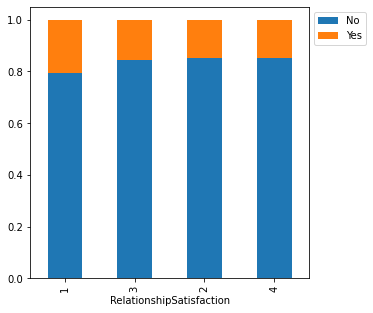

In [136]:
stacked_barplot(eda_df,"RelationshipSatisfaction","Attrition")

* Low relationship satisfaction rating does indicate more probability of attrition, but we need to investigate further which relationships do this variable indicate.

Attrition           No  Yes   All
StockOptionLevel                 
All               2466  474  2940
0                  954  308  1262
1                 1080  112  1192
3                  140   30   170
2                  292   24   316
------------------------------------------------------------------------------------------------------------------------


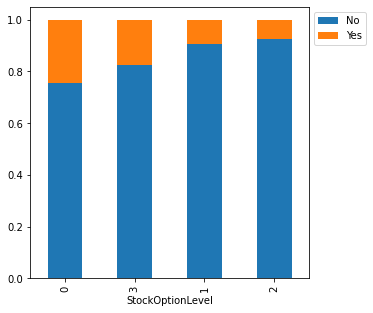

In [137]:
stacked_barplot(eda_df,"StockOptionLevel","Attrition")

* ~22% Employees with highest and lowest stock options attrite the more than others.
* Company should investigate more on why employees with highest stock options are attriting and take this as an opportunity to re-consider their stocks policy.

Attrition          No  Yes   All
WorkLifeBalance                 
All              2466  474  2940
3                1532  254  1786
2                 572  116   688
4                 252   54   306
1                 110   50   160
------------------------------------------------------------------------------------------------------------------------


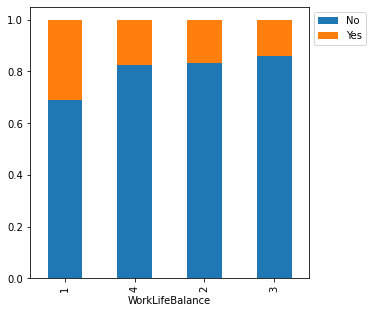

In [138]:
stacked_barplot(eda_df,"WorkLifeBalance","Attrition")

* Low work-life balance rating leads people to attrite, this is a good factor to preempt at attrition risk employees.

**Checking if performace rating and salary hike are related-**

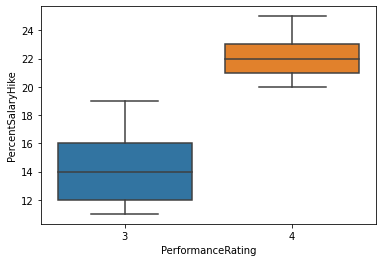

In [139]:
sns.boxplot(eda_df['PerformanceRating'],eda_df['PercentSalaryHike'])
plt.show()

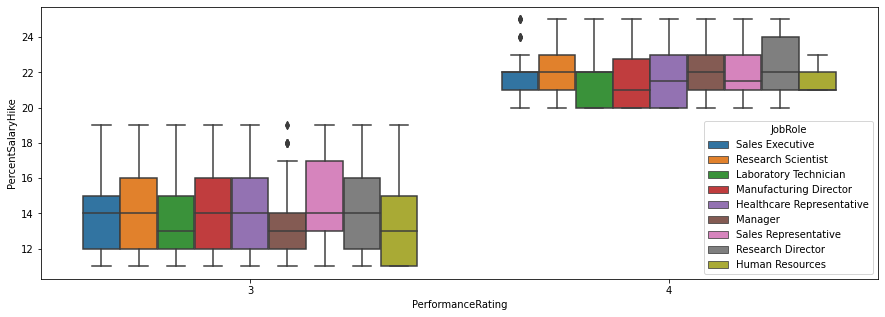

In [140]:
plt.figure(figsize=(15,5))
sns.boxplot(eda_df['PerformanceRating'],
            eda_df['PercentSalaryHike'],
            hue=eda_df['JobRole'])
plt.show()

**Observations-**
* Salary hikes are a function of Performance ratings.
* We have to investigate why the employees who get Excellent(3) and Outstanding(4) Performance rating attrite and how then can they be retained.

### **Detailed Summary of EDA**

**Data Description:**

* The dataset has 2940 rows and 35 columns of data.
* There are no null values in the dataset.
* Attrition, BusinessTravel, Department, EducationField, Gender, JobRole, MaritalStatus, Over18, OverTime are of object data type while others are of integer data type.

**Data Cleaning:**

* EmployeeNumber is an ID variable and not useful for predictive modeling.
* EmployeeCount has only 1 as the value in all the rows and can be dropped as it will not be adding any information to our analysis.
* Standard Hours has only 80 as the value in all the rows and can be dropped as it will not be adding any information to our analysis.
* As all the employees are aged more than 18, hence all the values in the Over18 column are 1. This variable was dropped.

**Observations from EDA:**

* `age`: The variable Age is normally distributed with an average equal to 37 years. Age is positively correlated JobLevel and Education (i.e., the older an employee is, the more educated and at a higher job level they are).
* `DailyRate`: It is having a fairly uniform distribution with an average of 800. Employees having lower Daily rates and less monthly wage are more likely to attrite.
* `DistanceFromHome`: This shows a right-skewed distribution. Most people stay at a close distance from home with few also leaving away from work. Employees who have to travel a more distance from their home attrite more.
* `HourlyRate`: It is an almost uniformly distributed variable. It has mean and median approx equal to 65. The hourly rate doesn't have much impact on attrition.
* `MonthlyIncome`: Monthly Income distribution is almost right-skewed. Few employees are earning much higher than the rest of the employees.  MonthlyIncome is highly correlated to Job Level (0.95). 
* `MonthlyRate`: It is a uniformly distributed variable with a median close to 14500. The monthly rate doesn't have much impact on attrition.
* `NumCompaniesWorked`: On average people have worked at 2.5 companies with a median of 2 companies. The majority of people have worked in only one company. Approx 350 people are freshers. There are employees worked at 9 companies. They will be the outliers.
* `PercentSalaryHike`:  It has a right-skewed distribution. It is correlated with performance rating with a coefficient of 0.77. Lesser salary hike also contributes to attrition.
* `TotalWorkingYears`: Work experience is having a significant right skew. It also contains few outliers.
* `YearsAtCompany`: Significantly skewed towards the right. Also contains outliers.
* `YearsInCurrentRole`: It is having few outliers. The lower whisker coincides with the first quartile.
* `YearsWithCurrManager`: It is a right-skewed variable with few outliers too.
* `BusinessTravel`: Almost 71% of employees have travel rarely and 19% travel frequently. As the travel frequency increases of an employee increases, the Attrition rate increases. There's a ~22% probability of employees attriting who travel frequently.
* `Department`: The R&D department consists of almost 65% of employees.
* `EducationField`:People with Life science background is dominant over others with almost 41% count.
* `Gender`: 60% of people are male while the rest are female.
* `JobRole`: Almost 22% of people are sales executives followed by 20% research scientists.
* `MaritalStatus`: Almost 46% of people are married and 32% are single.
* `OverTime`: Only almost 29% of people are ready to do overtime. Employees who work overtime tend to attrite more. There a ~35% probability of attrition among employees working overtime.
* `Attrition`: There's an imbalance in the data with 16% of the employees attriting and rest not.

 

* **Attrition vs Earnings of employee**:
    * Employees having lower Daily rates and less monthly wage are more likely to attrite.
    * Monthly rate and the hourly rate doesn't seem to have any effect on attrition.
    * Lesser salary hike also contributes to attrition.

* **Attrition vs Years working in company**
    * Those employees who have spent less time at a company, in a current role, or with a manager have higher chances of attriting.
    * Training doesn't seem to have an impact on Attrition.
    
* **Attrition vs Previous job roles**
    * Employees who have worked in more companies generally tend to switch more jobs hence attriting.
    * Employees who attrite generally have lesser years of experience.

*  **Attrition vs Department, Job Role and Education**
    * Majority of the employees work for the R&D department. The probability of attrition is least there.
    * Both Sales and HR have similar Attrition probability.
    * Sales Executives have an attrition probability of >40%.
    * Laboratory Technicians and Human Resource personnel also have high probabilities of attrition.
    * Attrition probability among Research Directors, Manufacturing directors Healthcare representatives, and Managers are much lower than the average attrition probability of 16%.
    * 25% of employees educated in human resources attrite.
    * Attrition probability is also high in the case of marketing and technical degree holders.


* Employees who say they have low satisfaction with their work environments are likely to attrite.
* There's a ~40% probability of attrition among employees with low ratings for environment satisfaction.

* Job Involvement looks like a very strong indicator of attrition.
* Higher the job involvement, greater is the chance that the employee will stay with us and not attrite.
* Employees unhappy with their job involvement have ~55% probability of attriting (those who rated 0 and 1).
* Further investigation to understand how this variable was collected will give more insights.

* Salary hikes are a function of Performance ratings.
* We have to investigate why the employees who get Excellent(3) and Outstanding(4) Performance rating attrite and how then can they be retained.

### To jump back to the **Model Building** Data preparation  section, click [here](#data_preparation).

### To jump back to the EDA summary section, click [here](#eda).